<a href="https://colab.research.google.com/github/IuliiaSor/Course-Project/blob/main/HSE_UDA_2021_Davydova%2C_Sorokina_Course_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center>HSE ANR UDA 2021: COURSE PROJECT</center>

#### <hr /> General Information

**Authors:** Davydova Violetta and Sorokina Julia

**Objective of the project:** clustering based on the results obtained by models

**Data:** [kaggle movie review](https://www.kaggle.com/lakshmi25npathi/imdb-dataset-of-50k-movie-reviews) competition <br>

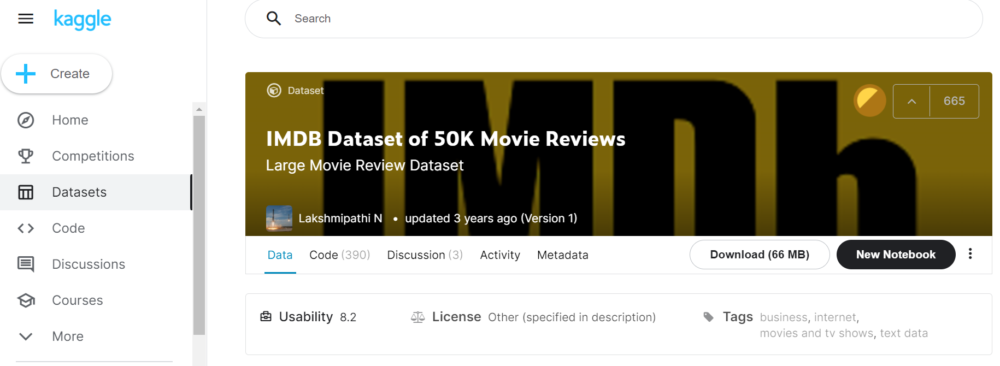

**Steps:** 

1.   Preprotessing of data
2.   Vectorization
3.   Model CBOW/Glove/Fasttext
4.   Clustering
5.   Comments and conclusions are attached





### 0. Load data

In [ ]:
## для Jupyter Notebook

!pip install google
!pip install --upgrade google-api-python-client

!pip install google-cloud
!pip install google-cloud-vision

!pip install google.cloud.bigquery
!pip install google.cloud.storage

     |████████████████████████████████| 7.9 MB 5.4 MB/s 
  Attempting uninstall: google-auth-httplib2
    Found existing installation: google-auth-httplib2 0.0.4
    Uninstalling google-auth-httplib2-0.0.4:
      Successfully uninstalled google-auth-httplib2-0.0.4
  Attempting uninstall: google-api-python-client
    Found existing installation: google-api-python-client 1.12.8
    Uninstalling google-api-python-client-1.12.8:
      Successfully uninstalled google-api-python-client-1.12.8
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
earthengine-api 0.1.290 requires google-api-python-client<2,>=1.12.1, but you have google-api-python-client 2.33.0 which is incompatible.
     |████████████████████████████████| 370 kB 5.4 MB/s 
     |████████████████████████████████| 109 kB 55.2 MB/s 
     |████████████████████████████████| 45 kB 2.1 MB/s 
     |██████████████████

     |████████████████████████████████| 93 kB 1.0 MB/s 
  Attempting uninstall: google-api-core
    Found existing installation: google-api-core 2.3.2
    Uninstalling google-api-core-2.3.2:
      Successfully uninstalled google-api-core-2.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
earthengine-api 0.1.290 requires google-api-python-client<2,>=1.12.1, but you have google-api-python-client 2.33.0 which is incompatible.


In [ ]:
# установка и импорт библиотеки pandas
import pandas

In [ ]:
# подключение Google Диска для Google Colab'а
from google.colab import drive
drive.mount("/content/drive/")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
# основная директория, в которой лежат данные и другие файлы
DATA_FOLDER = "/content/drive/MyDrive/data/"

In [ ]:
# чтение csv файла с данными
data = pandas.read_csv(DATA_FOLDER + "IMDB Dataset.csv")

In [ ]:
# проверка данных
data.head(10)

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive
5,"Probably my all-time favorite movie, a story o...",positive
6,I sure would like to see a resurrection of a u...,positive
7,"This show was an amazing, fresh & innovative i...",negative
8,Encouraged by the positive comments about this...,negative
9,If you like original gut wrenching laughter yo...,positive


In [ ]:
# размер рассматриваемых данных
data.size

100000

In [ ]:
# получение только столбца с текстом
texts = list(data["review"])[:500] 

In [ ]:
# провера корректности загрузки данных
print("Количество рецензий:", len(texts))

Количество рецензий: 500


### 1. Preprotessing of data

Preprocessing of Data это этап Data Mining, который включает в себя трансформацию исходных данных в доступный для понимания формат.



#### Tokenisation

Токенизация – процесс разбиения текстового документа на отдельные слова, которые называются токенами.

*Токенизация с помощью Spacy*



In [ ]:
# установка и импорт библиотеки Spacy
!pip install spacy
import spacy

In [ ]:
# скачивание и загрузка модели
!python -m spacy download en_core_web_sm

nlp = spacy.load("en_core_web_sm")

     |████████████████████████████████| 12.0 MB 6.2 MB/s 
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')


In [ ]:
# проведение токенизации рецензий (texts - набор рецензий (текстов, обычных строк))
docs = [nlp(t) for t in texts]

# получение списка списков токенов для каждой рецензии
tokens_spacy = [[token.text for token in doc] for doc in docs]

In [ ]:
# вывод токенов для проверки
print("Токены:", tokens_spacy)

Токены: [['One', 'of', 'the', 'other', 'reviewers', 'has', 'mentioned', 'that', 'after', 'watching', 'just', '1', 'Oz', 'episode', 'you', "'ll", 'be', 'hooked', '.', 'They', 'are', 'right', ',', 'as', 'this', 'is', 'exactly', 'what', 'happened', 'with', 'me.<br', '/><br', '/>The', 'first', 'thing', 'that', 'struck', 'me', 'about', 'Oz', 'was', 'its', 'brutality', 'and', 'unflinching', 'scenes', 'of', 'violence', ',', 'which', 'set', 'in', 'right', 'from', 'the', 'word', 'GO', '.', 'Trust', 'me', ',', 'this', 'is', 'not', 'a', 'show', 'for', 'the', 'faint', 'hearted', 'or', 'timid', '.', 'This', 'show', 'pulls', 'no', 'punches', 'with', 'regards', 'to', 'drugs', ',', 'sex', 'or', 'violence', '.', 'Its', 'is', 'hardcore', ',', 'in', 'the', 'classic', 'use', 'of', 'the', 'word.<br', '/><br', '/>It', 'is', 'called', 'OZ', 'as', 'that', 'is', 'the', 'nickname', 'given', 'to', 'the', 'Oswald', 'Maximum', 'Security', 'State', 'Penitentary', '.', 'It', 'focuses', 'mainly', 'on', 'Emerald', 'Ci

*Токенизация с помощью nltk*

In [ ]:
# установка и импорт библиотеки nltk
!pip install nltk
import nltk
from nltk.tokenize import word_tokenize

In [ ]:
# скачивание нужного модуля библиотеки
nltk.download("punkt")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# проведение токенизации рецензий (texts - набор рецензий (текстов, обычных строк))
# получение списка списков токенов для каждой рецензии
tokens_nltk = [word_tokenize(t) for t in texts]

In [ ]:
print("Токены:", tokens_nltk)

Токены: [['One', 'of', 'the', 'other', 'reviewers', 'has', 'mentioned', 'that', 'after', 'watching', 'just', '1', 'Oz', 'episode', 'you', "'ll", 'be', 'hooked', '.', 'They', 'are', 'right', ',', 'as', 'this', 'is', 'exactly', 'what', 'happened', 'with', 'me.', '<', 'br', '/', '>', '<', 'br', '/', '>', 'The', 'first', 'thing', 'that', 'struck', 'me', 'about', 'Oz', 'was', 'its', 'brutality', 'and', 'unflinching', 'scenes', 'of', 'violence', ',', 'which', 'set', 'in', 'right', 'from', 'the', 'word', 'GO', '.', 'Trust', 'me', ',', 'this', 'is', 'not', 'a', 'show', 'for', 'the', 'faint', 'hearted', 'or', 'timid', '.', 'This', 'show', 'pulls', 'no', 'punches', 'with', 'regards', 'to', 'drugs', ',', 'sex', 'or', 'violence', '.', 'Its', 'is', 'hardcore', ',', 'in', 'the', 'classic', 'use', 'of', 'the', 'word.', '<', 'br', '/', '>', '<', 'br', '/', '>', 'It', 'is', 'called', 'OZ', 'as', 'that', 'is', 'the', 'nickname', 'given', 'to', 'the', 'Oswald', 'Maximum', 'Security', 'State', 'Penitentar

#### Delete stop words



Стоп-слова – это часто используемые слова, которые не вносят никакой дополнительной информации в текст. Например, слова типа "the", "is", "a" не несут никакой ценности и только добавляют шум в данные.

*Удаление stopwords с помощью Spacy*

In [ ]:
# импорт библиотеки re для работы с регулярными выражениями
import re

# символы пунктуации для удаления
punctuation = '[!"#$%&()*\+,-\./:;<=>?@\[\]^_`{|}~„“«»†*\—/\-‘’]'

# символ для удаления, который есть именно в наших данных
others = ["<br />", "</s>"]

In [ ]:
# приводит все символы к нижнему регистру
clean_texts = [t.lower() for t in texts]

# удаляем символы
for other in others:
  clean_texts = [re.sub(other, r"", t) for t in clean_texts]
clean_texts = [re.sub(punctuation, r"", t) for t in clean_texts]

In [ ]:
# проводим токенизацию на очищенном тексте и получаем список списков более качественных токенов
docs = [nlp(t) for t in clean_texts]

# удаляем stopwords из токенов
clean_tokens_spacy = [[token for token in doc if not token.is_stop and token.text.isalnum()] for doc in docs]

In [ ]:
print("Очищенные токены:", clean_tokens_spacy)

Очищенные токены: [[reviewers, mentioned, watching, 1, oz, episode, hooked, right, exactly, happened, methe, thing, struck, oz, brutality, unflinching, scenes, violence, set, right, word, trust, faint, hearted, timid, pulls, punches, regards, drugs, sex, violence, hardcore, classic, use, wordit, called, oz, nickname, given, oswald, maximum, security, state, penitentary, focuses, mainly, emerald, city, experimental, section, prison, cells, glass, fronts, face, inwards, privacy, high, agenda, em, city, home, manyaryans, muslims, gangstas, latinos, christians, italians, irish, moreso, scuffles, death, stares, dodgy, dealings, shady, agreements, far, awayi, main, appeal, fact, goes, shows, dare, forget, pretty, pictures, painted, mainstream, audiences, forget, charm, forget, romanceoz, mess, episode, saw, struck, nasty, surreal, ready, watched, developed, taste, oz, got, accustomed, high, levels, graphic, violence, violence, injustice, crooked, guards, sold, nickel, inmates, kill, order, a

*Удаление stopwords с помощью nltk*

In [ ]:
# импорт модуля библиотеки
from nltk import corpus

In [ ]:
# скачивание и получение списка stopwords
nltk.download("stopwords")
stopwords = corpus.stopwords.words("english")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
print("Количество stopwords:", len(stopwords))
print("Stopwords:", stopwords)

Количество stopwords: 179
Stopwords: ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', '

In [ ]:
# проводим токенизацию на очищенном тексте и получаем список списков более качественных токенов
tokens_nltk = [word_tokenize(t) for t in clean_texts]

# удаляем stopwords из токенов
clean_tokens_nltk = [token for token in tokens_nltk if token not in stopwords]

In [ ]:
print("Очищенные токены:", clean_tokens_nltk)

Очищенные токены: [['one', 'of', 'the', 'other', 'reviewers', 'has', 'mentioned', 'that', 'after', 'watching', 'just', '1', 'oz', 'episode', 'you', "'ll", 'be', 'hooked', 'they', 'are', 'right', 'as', 'this', 'is', 'exactly', 'what', 'happened', 'with', 'methe', 'first', 'thing', 'that', 'struck', 'me', 'about', 'oz', 'was', 'its', 'brutality', 'and', 'unflinching', 'scenes', 'of', 'violence', 'which', 'set', 'in', 'right', 'from', 'the', 'word', 'go', 'trust', 'me', 'this', 'is', 'not', 'a', 'show', 'for', 'the', 'faint', 'hearted', 'or', 'timid', 'this', 'show', 'pulls', 'no', 'punches', 'with', 'regards', 'to', 'drugs', 'sex', 'or', 'violence', 'its', 'is', 'hardcore', 'in', 'the', 'classic', 'use', 'of', 'the', 'wordit', 'is', 'called', 'oz', 'as', 'that', 'is', 'the', 'nickname', 'given', 'to', 'the', 'oswald', 'maximum', 'security', 'state', 'penitentary', 'it', 'focuses', 'mainly', 'on', 'emerald', 'city', 'an', 'experimental', 'section', 'of', 'the', 'prison', 'where', 'all', '

#### Stemmization

Стеммизация – процесс приведения слова к его корню/основе.

*Нормализация с помощью Spacy*

In [ ]:
# получение списка нормализованных токенов из очищенных
norm_clean_tokens_spacy = [[token.lemma_ for token in doc] for doc in clean_tokens_spacy]

In [ ]:
print("Нормализованные токены:", norm_clean_tokens_spacy)

Нормализованные токены: [['reviewer', 'mention', 'watch', '1', 'oz', 'episode', 'hook', 'right', 'exactly', 'happen', 'methe', 'thing', 'strike', 'oz', 'brutality', 'unflinche', 'scene', 'violence', 'set', 'right', 'word', 'trust', 'faint', 'hearted', 'timid', 'pull', 'punch', 'regard', 'drug', 'sex', 'violence', 'hardcore', 'classic', 'use', 'wordit', 'call', 'oz', 'nickname', 'give', 'oswald', 'maximum', 'security', 'state', 'penitentary', 'focus', 'mainly', 'emerald', 'city', 'experimental', 'section', 'prison', 'cell', 'glass', 'front', 'face', 'inward', 'privacy', 'high', 'agenda', '-PRON-', 'city', 'home', 'manyaryans', 'muslims', 'gangstas', 'latinos', 'christians', 'italian', 'irish', 'moreso', 'scuffle', 'death', 'stare', 'dodgy', 'dealing', 'shady', 'agreement', 'far', 'awayi', 'main', 'appeal', 'fact', 'go', 'show', 'dare', 'forget', 'pretty', 'picture', 'paint', 'mainstream', 'audience', 'forget', 'charm', 'forget', 'romanceoz', 'mess', 'episode', 'see', 'strike', 'nasty', 

*Нормализация с помощью nltk*

In [ ]:
# импорт модуля библиотеки
from nltk.stem import PorterStemmer

# получение списка нормализованных токенов из очищенных с помощью стеммера
porter = PorterStemmer()
norm_clean_tokens_nltk = [[porter.stem(token) for token in doc] for doc in clean_tokens_nltk]

In [ ]:
print("Нормализованные токены:", norm_clean_tokens_nltk)

Нормализованные токены: [['one', 'of', 'the', 'other', 'review', 'ha', 'mention', 'that', 'after', 'watch', 'just', '1', 'oz', 'episod', 'you', "'ll", 'be', 'hook', 'they', 'are', 'right', 'as', 'thi', 'is', 'exactli', 'what', 'happen', 'with', 'meth', 'first', 'thing', 'that', 'struck', 'me', 'about', 'oz', 'wa', 'it', 'brutal', 'and', 'unflinch', 'scene', 'of', 'violenc', 'which', 'set', 'in', 'right', 'from', 'the', 'word', 'go', 'trust', 'me', 'thi', 'is', 'not', 'a', 'show', 'for', 'the', 'faint', 'heart', 'or', 'timid', 'thi', 'show', 'pull', 'no', 'punch', 'with', 'regard', 'to', 'drug', 'sex', 'or', 'violenc', 'it', 'is', 'hardcor', 'in', 'the', 'classic', 'use', 'of', 'the', 'wordit', 'is', 'call', 'oz', 'as', 'that', 'is', 'the', 'nicknam', 'given', 'to', 'the', 'oswald', 'maximum', 'secur', 'state', 'penitentari', 'it', 'focus', 'mainli', 'on', 'emerald', 'citi', 'an', 'experiment', 'section', 'of', 'the', 'prison', 'where', 'all', 'the', 'cell', 'have', 'glass', 'front', 'a

*Использование Snowball Stemmer с токенами полученными с помощью spacy*

In [ ]:
# импорт модуля библиотеки
from nltk.stem.snowball import SnowballStemmer

In [ ]:
# создание snowball stemmer для анлийского языка
snowball = SnowballStemmer("english")

In [ ]:
# проведение нормализации с помощью snowball stemmer и получение токенов
sb_clean_tokens_spacy = [[snowball.stem(token) for token in doc] for doc in norm_clean_tokens_spacy]

In [ ]:
print("Нормализованные с помощью snowball stemmer токены: ", sb_clean_tokens_spacy)

Нормализованные с помощью snowball stemmer токены:  [['review', 'mention', 'watch', '1', 'oz', 'episod', 'hook', 'right', 'exact', 'happen', 'meth', 'thing', 'strike', 'oz', 'brutal', 'unflinch', 'scene', 'violenc', 'set', 'right', 'word', 'trust', 'faint', 'heart', 'timid', 'pull', 'punch', 'regard', 'drug', 'sex', 'violenc', 'hardcor', 'classic', 'use', 'wordit', 'call', 'oz', 'nicknam', 'give', 'oswald', 'maximum', 'secur', 'state', 'penitentari', 'focus', 'main', 'emerald', 'citi', 'experiment', 'section', 'prison', 'cell', 'glass', 'front', 'face', 'inward', 'privaci', 'high', 'agenda', '-pron-', 'citi', 'home', 'manyaryan', 'muslim', 'gangsta', 'latino', 'christian', 'italian', 'irish', 'moreso', 'scuffl', 'death', 'stare', 'dodgi', 'deal', 'shadi', 'agreement', 'far', 'awayi', 'main', 'appeal', 'fact', 'go', 'show', 'dare', 'forget', 'pretti', 'pictur', 'paint', 'mainstream', 'audienc', 'forget', 'charm', 'forget', 'romanceoz', 'mess', 'episod', 'see', 'strike', 'nasti', 'surrea

*Использование Snowball Stemmer с токенами полученными с помощью nltk*

In [ ]:
# проведение нормализации с помощью snowball stemmer и получение токенов
sb_clean_tokens_nltk = [[snowball.stem(token) for token in doc] for doc in clean_tokens_nltk]

In [ ]:
print("Нормализованные с помощью snowball stemmer токены: ", sb_clean_tokens_nltk)

Нормализованные с помощью snowball stemmer токены:  [['one', 'of', 'the', 'other', 'review', 'has', 'mention', 'that', 'after', 'watch', 'just', '1', 'oz', 'episod', 'you', 'll', 'be', 'hook', 'they', 'are', 'right', 'as', 'this', 'is', 'exact', 'what', 'happen', 'with', 'meth', 'first', 'thing', 'that', 'struck', 'me', 'about', 'oz', 'was', 'it', 'brutal', 'and', 'unflinch', 'scene', 'of', 'violenc', 'which', 'set', 'in', 'right', 'from', 'the', 'word', 'go', 'trust', 'me', 'this', 'is', 'not', 'a', 'show', 'for', 'the', 'faint', 'heart', 'or', 'timid', 'this', 'show', 'pull', 'no', 'punch', 'with', 'regard', 'to', 'drug', 'sex', 'or', 'violenc', 'it', 'is', 'hardcor', 'in', 'the', 'classic', 'use', 'of', 'the', 'wordit', 'is', 'call', 'oz', 'as', 'that', 'is', 'the', 'nicknam', 'given', 'to', 'the', 'oswald', 'maximum', 'secur', 'state', 'penitentari', 'it', 'focus', 'main', 'on', 'emerald', 'citi', 'an', 'experiment', 'section', 'of', 'the', 'prison', 'where', 'all', 'the', 'cell', 

### 2. Text Data vectorization



Векторизация – процесс конвертации текста в числа. После Text Preprocessing текстовые данные представляются в числовом виде, то есть текстовые данные кодируются в виде чисел, которые в дальнейшем могут использоваться в алгоритмах.



In [ ]:
# используем данную переменную для того, чтобы в дальнейшем использовать только указанные токены
tokens_to_use = norm_clean_tokens_spacy

*Получение Bag of Words*

Это одна из самых простых методик векторизации текста. В логике BOW два предложения могут называться одинаковыми, если содержат один и тот же набор слов.

In [ ]:
# установка и импорт библиотеки gensim
!pip install gensim
from gensim import corpora

In [ ]:
# создание словаря уникальных токенов из списка токенов
dictionary = corpora.Dictionary(tokens_to_use)

In [ ]:
print("Словарь: ", dictionary)

Словарь:  Dictionary(11735 unique tokens: ['-PRON-', '1', 'accustomed', 'agenda', 'agreement']...)


In [ ]:
# получение Bag of Words для списка списков токенов отдельно для каждой рецензии
bows = [dictionary.doc2bow(doc, allow_update=True) for doc in tokens_to_use]

In [ ]:
print("Bag of Words:", bows)

Bag of Words: [[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 2), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 2), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 3), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 2), (50, 1), (51, 1), (52, 1), (53, 2), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 1), (78, 5), (79, 1), (80, 1), (81, 1), (82, 1), (83, 3), (84, 1), (85, 1), (86, 1), (87, 1), (88, 1), (89, 1), (90, 2), (91, 1), (92, 1), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 1), (100, 1), (101, 1), (102, 1), (103, 1), (104, 1), (105, 1), (106, 2), (107, 1), (108, 1), (109

*Нахождение наиболее важных фраз*

In [ ]:
# импорт модулей библиотеки
from gensim.models.phrases import Phrases, Phraser

In [ ]:
# получение фраз из двух слов, так называемых биграмм
bigram = Phrases(tokens_to_use, min_count=2)
bigram_phraser = Phraser(bigram)

In [ ]:
print("Количество биграмм:", len(bigram_phraser.phrasegrams))
print("Биграммы:", list(bigram_phraser.phrasegrams.keys()))

Количество биграмм: 414
Биграммы: [(b'sex', b'violence'), (b'spend', b'time'), (b'serial', b'killer'), (b'woody', b'allen'), (b'little', b'boy'), (b'soap', b'opera'), (b'real', b'life'), (b'time', b'money'), (b'mr', b'mattei'), (b'human', b'relation'), (b'new', b'york'), (b'despite', b'have'), (b'have', b'see'), (b'25', b'year'), (b'tear', b'eye'), (b'black', b'white'), (b'complete', b'waste'), (b'waste', b'time'), (b'look', b'forward'), (b'look', b'cheap'), (b'end', b'credit'), (b'good', b'performance'), (b'low', b'budget'), (b'beautiful', b'woman'), (b'12', b'year'), (b'year', b'old'), (b'predictable', b'plot'), (b'year', b'later'), (b'big', b'fan'), (b'far', b'cry'), (b'look', b'like'), (b'mad', b'scientist'), (b'go', b'far'), (b'fight', b'scene'), (b'high', b'school'), (b'lesson', b'learn'), (b'special', b'effect'), (b'character', b'development'), (b'star', b'wars'), (b'final', b'scene'), (b'story', b'line'), (b'save', b'money'), (b'true', b'story'), (b'couple', b'hour'), (b'die', 

In [ ]:
# конвертируем представление биграмм в строку состоящую из первого слова, нижнего подчёркивания и второго слова
bigrams_list = [pair[0].decode("utf-8") + "_" + pair[1].decode("utf-8") for pair in list(bigram_phraser.phrasegrams.keys())]

In [ ]:
print("Список биграмм:", bigrams_list)

Список биграмм: ['sex_violence', 'spend_time', 'serial_killer', 'woody_allen', 'little_boy', 'soap_opera', 'real_life', 'time_money', 'mr_mattei', 'human_relation', 'new_york', 'despite_have', 'have_see', '25_year', 'tear_eye', 'black_white', 'complete_waste', 'waste_time', 'look_forward', 'look_cheap', 'end_credit', 'good_performance', 'low_budget', 'beautiful_woman', '12_year', 'year_old', 'predictable_plot', 'year_later', 'big_fan', 'far_cry', 'look_like', 'mad_scientist', 'go_far', 'fight_scene', 'high_school', 'lesson_learn', 'special_effect', 'character_development', 'star_wars', 'final_scene', 'story_line', 'save_money', 'true_story', 'couple_hour', 'die_hard', 'bad_guy', 'action_sequence', 'matter_fact', 'live_action', 'main_character', 'feel_like', 'karen_carpenter', 'good_actress', 'actress_play', 'great_job', 'human_being', 'miss_point', 'open_door', 'new_twist', 'subject_matter', 'set_design', 'good_director', 'open_mind', 'leave_theater', 'romantic_comedy', 'fail_miserably

In [ ]:
# получение токенов с биграммами
bigram_tokens = [bigram_phraser[doc] for doc in tokens_to_use]

In [ ]:
# импорт модуля библиотеки и библиотеки numpy
from gensim import models
import numpy as np

In [ ]:
# создание словаря уникальных токенов из списка токенов с биграммами
bigram_dictionary = corpora.Dictionary(bigram_tokens)

# получение Bag of Words для списка токенов с биграммами
bigram_bows = [bigram_dictionary.doc2bow(token) for token in bigram_tokens]

# расчёт TF-IDF для списка с биграммами
bigram_tfidf_model = models.TfidfModel(bigram_bows)

In [ ]:
# создание списка с биграммами и весом TF-IDF
bigram_weight_tfidf = []
for doc in bigram_tfidf_model[bigram_bows]:
    for id, freq in doc:
        if bigram_dictionary[id] in bigrams_list:
            bigram_weight_tfidf.append([bigram_dictionary[id], np.around(freq, decimals=3)])

In [ ]:
print("Биграммы с весом TF-IDF:", bigram_weight_tfidf)

Биграммы с весом TF-IDF: [['sex_violence', 0.08], ['serial_killer', 0.115], ['spend_time', 0.132], ['woody_allen', 0.147], ['little_boy', 0.117], ['real_life', 0.097], ['soap_opera', 0.13], ['human_relation', 0.245], ['mr_mattei', 0.414], ['new_york', 0.092], ['time_money', 0.107], ['25_year', 0.178], ['despite_have', 0.178], ['tear_eye', 0.178], ['black_white', 0.117], ['complete_waste', 0.16], ['end_credit', 0.195], ['good_performance', 0.158], ['look_cheap', 0.195], ['look_forward', 0.158], ['low_budget', 0.146], ['12_year', 0.149], ['beautiful_woman', 0.161], ['predictable_plot', 0.149], ['year_later', 0.117], ['big_fan', 0.055], ['far_cry', 0.198], ['fight_scene', 0.055], ['go_far', 0.055], ['look_like', 0.034], ['mad_scientist', 0.066], ['high_school', 0.136], ['lesson_learn', 0.168], ['special_effect', 0.116], ['character_development', 0.095], ['final_scene', 0.106], ['save_money', 0.117], ['star_wars', 0.117], ['story_line', 0.101], ['waste_time', 0.087], ['couple_hour', 0.17],

Итак, на основе того, что Tf-Idf = частота слова - обратная частота документа, то можно сделать вывод, что sex_violence встречаются в рассматриваемых данных чаще.

In [ ]:
# получение списка фраз из биграмм
phrases_weight_tfidf = bigram_weight_tfidf

In [ ]:
# сортировка по весу TF-IDF по убыванию
sorted_phrases_weight_tfidf = sorted(phrases_weight_tfidf, key=lambda item: item[1])

In [ ]:
print("Количество отсортированных фраз:", len(sorted_phrases_weight_tfidf))
print("Отсортированные фразы:", sorted_phrases_weight_tfidf)

Количество отсортированных фраз: 1389
Отсортированные фразы: [['main_character', 0.025], ['take_place', 0.026], ['feel_like', 0.026], ['look_like', 0.026], ['real_life', 0.027], ['take_place', 0.027], ['main_character', 0.028], ['look_like', 0.03], ['year_ago', 0.03], ['fall_love', 0.031], ['take_place', 0.032], ['human_being', 0.032], ['story_unfold', 0.032], ['year_old', 0.032], ['subject_matter', 0.033], ['tell_story', 0.033], ['good_job', 0.033], ['look_like', 0.034], ['10_10', 0.034], ['read_book', 0.034], ['support_cast', 0.034], ['box_office', 0.034], ['look_like', 0.035], ['feel_need', 0.035], ['look_like', 0.036], ['bad_guy', 0.036], ['read_book', 0.036], ['spencer_tracy', 0.037], ['feel_like', 0.037], ['second_half', 0.037], ['great_job', 0.037], ['middle_night', 0.037], ['know_exactly', 0.037], ['plot_element', 0.037], ['take_shot', 0.038], ['great_deal', 0.038], ['father_son', 0.038], ['year_later', 0.038], ['look_like', 0.039], ['woman_name', 0.039], ['feel_sorry', 0.039],

In [ ]:
# получение пятидесяти самых важных фраз (имеют наименьший вес TF-IDF)
most_important_top_50_phrases = [pair[0] for pair in sorted_phrases_weight_tfidf[:50]]

In [ ]:
print("50 самых важных фраз:", most_important_top_50_phrases)

50 самых важных фраз: ['main_character', 'take_place', 'feel_like', 'look_like', 'real_life', 'take_place', 'main_character', 'look_like', 'year_ago', 'fall_love', 'take_place', 'human_being', 'story_unfold', 'year_old', 'subject_matter', 'tell_story', 'good_job', 'look_like', '10_10', 'read_book', 'support_cast', 'box_office', 'look_like', 'feel_need', 'look_like', 'bad_guy', 'read_book', 'spencer_tracy', 'feel_like', 'second_half', 'great_job', 'middle_night', 'know_exactly', 'plot_element', 'take_shot', 'great_deal', 'father_son', 'year_later', 'look_like', 'woman_name', 'feel_sorry', 'pretty_good', 'go_insane', '10_minute', 'little_boy', 'open_door', 'talented_actor', 'come_life', 'interest_movie', 'huge_fan']


Также можно заметить, что среди 50ти самых важных фраз имеет место sex_violence.

### 3. Models

In [ ]:
# размерность векторов, которые соответствуют каждому токену текста
DIMENSIONALITY = 50

#### Fasttext

**Преимущества:** относительно простая архитектура: feed-forward, 1 вход, 1 скрытый слой, один выход (хотя n-граммы добавляют сложность в генерацию эмбеддингов); благодаря n-граммам неплохо работает на редких и устаревших словах.

**Недостатки:** обучение на уровне слов: нет информации о предложении или контексте, в котором используется слово; игнорируется совместная встречаемость, то есть модель не учитывает различное значение слова в разных контекстах (поэтому GloVe может быть предпочтительнее).



In [ ]:
# установка и импорт библиотеки fasttext
!pip install fasttext

import fasttext
import fasttext.util

In [ ]:
# скачивание предобученной модели для английского текста
# fasttext.util.download_model("en")

# загрузка предобученной модели из файла
# pretrained_model = fasttext.load_model("cc.en.300.bin")

In [ ]:
# уменьшение размерности модели
# fasttext.util.reduce_model(pretrained_model, DIMENSIONALITY)

# сохранение модели с уменьшённой размерностью в файл
# pretrained_model.save_model(DATA_FOLDER + "cc.en." + str(DIMENSIONALITY) + ".bin")

In [ ]:
# загрузка предобученной модели из файла
pretrained_model = fasttext.load_model(DATA_FOLDER + "cc.en." + str(DIMENSIONALITY) + ".bin")

In [ ]:
# векторизация текста из токенов отдельно для каждой рецензии (получается список списков, как всегда)
vectorized_texts = [[pretrained_model[t] for t in doc] for doc in tokens_to_use]

In [ ]:
print("Векторизованный текст:", vectorized_texts[:10]) # ограничение в 10 из-за вывода большого количество данных

Выходные данные были обрезаны до нескольких последних строк (5000).
        0.01317216, -0.02582436,  0.03289829,  0.02803182,  0.0170562 ,
       -0.07225054,  0.0269743 ,  0.01906644,  0.01805219,  0.02790619,
       -0.03740702,  0.07493255,  0.06968084,  0.01025776, -0.06502405,
       -0.02404086,  0.01107659, -0.02145942, -0.02496978,  0.02329002,
       -0.01387979,  0.03536038, -0.00429476, -0.13462035,  0.03957936,
        0.07726829,  0.04981337, -0.06744205, -0.03197846,  0.0845874 ,
        0.0232984 ,  0.02072096, -0.04551037, -0.08338894,  0.0338704 ],
      dtype=float32), array([-0.09141281, -0.09307185,  0.06939689, -0.05849148, -0.11297085,
       -0.07496861,  0.00656102, -0.01155934,  0.04169755, -0.0024616 ,
        0.03116616,  0.01024296, -0.06252973,  0.03865146,  0.02935736,
       -0.03497661, -0.04173555, -0.07712796,  0.04928429, -0.03321464,
        0.02511539,  0.01945278, -0.01126152,  0.00243037, -0.03458156,
        0.07770675,  0.07530014, -0.06909575,

In [ ]:
# получение списка текстов из очищенных токенов
clean_docs = [" ".join(doc) for doc in tokens_to_use]

#### CBOW

**Преимущества:** простая архитектура: feed-forward, 1 вход, 1 скрытый слой, 1 выход; модель быстро обучается и генерирует эмбеддинги (даже ваши собственные); эмбеддинги наделены смыслом, спорные моменты поддаются расшифровке; методология может быть распространена на множество других областей/проблем (например, Lda2vec).

**Недостатки:** обучение на уровне слов: нет информации о предложении или контексте, в котором используется слово; совместная встречаемость игнорируется; модель не учитывает то, что слово может иметь различное значение в зависимости от контекста использования – это основная причина, по которой GloVe обычно предпочтительнее Word2Vec; не очень хорошо обрабатывает неизвестные и редкие слова.


In [ ]:
# запись в файл текста полученных рецензий для дальнейшего использования
TEXT_FILEPATH = DATA_FOLDER + "text.txt"
with open(TEXT_FILEPATH, "w", encoding="utf-8") as file:
    file.write("\n".join(clean_docs))

In [ ]:
# создание новой модели и автоматическое обучение на тексте из выбранного файла
model_cbow = fasttext.train_unsupervised(TEXT_FILEPATH, model="cbow", dim=DIMENSIONALITY, epoch=20)

In [ ]:
# векторизация текста с помощью обученной модели CBOW
cbow_vectorized_texts = [[model_cbow[t] for t in doc] for doc in tokens_to_use]

In [ ]:
print("Векторизованный с помощью CBOW модели текст:", cbow_vectorized_texts[:10]) # ограничение в 10 из-за вывода большого количество данных

Выходные данные были обрезаны до нескольких последних строк (5000).
       -0.26653492, -0.05895252,  0.17122625, -0.11374532, -0.13176402,
       -0.15715978,  0.42980796,  0.29512545, -0.06057738, -0.05309884,
        0.218397  ,  0.09138161, -0.00962063,  0.28091794, -0.2732323 ],
      dtype=float32), array([-0.20017956,  0.10711528,  0.01203193, -0.28939328, -0.09861258,
       -0.31781447, -0.03718056,  0.51914996, -0.29482216,  0.00820905,
        0.0036384 ,  0.27962714,  0.15190795,  0.01868488, -0.16035897,
        0.08560845,  0.05213704,  0.01753526, -0.08749977, -0.24763224,
       -0.20030852,  0.02459909,  0.04573864, -0.1485237 , -0.03393827,
       -0.05254712,  0.65423733,  0.5240808 , -0.20834714, -0.14311971,
        0.32494745,  0.37699178,  0.03018314,  0.07361788, -0.06553075,
       -0.29251412, -0.04027121,  0.17875034, -0.09388731, -0.13155682,
       -0.1920141 ,  0.4771386 ,  0.30117556, -0.07956244, -0.03444739,
        0.21766979,  0.09646959, -0.01969272,

#### Glove

[Ссылка на модель c github.com](https://github.com/maierhofert/glove.py/blob/master/glove.py)

**Преимущества:** простая архитектура без нейронной сети; модель быстрая, и этого может быть достаточно для простых приложений; GloVe улучшает Word2Vec – она добавляет частоту встречаемости слов и опережает Word2Vec на большинстве бенчмарков; осмысленные эмбеддинги.

**Недостатки:** хотя матрица совместной встречаемости предоставляет глобальную информацию, GloVe остаётся обученной на уровне слов и даёт немного данных о предложении и контексте, в котором слово используется; плохо обрабатывает неизвестные и редкие слова.


In [ ]:
#!/usr/bin/env python

from argparse import ArgumentParser
import codecs
from collections import Counter
import itertools
from functools import partial
import logging
from math import log
import os.path
import _pickle as pickle
from random import shuffle

import msgpack
import numpy as np
from scipy import sparse

!pip install listify
from listify import listify


logger = logging.getLogger("glove")


def parse_args():
    parser = ArgumentParser(
        description=('Build a GloVe vector-space model from the '
                     'provided corpus'))

    parser.add_argument('corpus', metavar='corpus_path',
                        type=partial(codecs.open, encoding='utf-8'))

    g_vocab = parser.add_argument_group('Vocabulary options')
    g_vocab.add_argument('--vocab-path',
                         help=('Path to vocabulary file. If this path '
                               'exists, the vocabulary will be loaded '
                               'from the file. If it does not exist, '
                               'the vocabulary will be written to this '
                               'file.'))

    g_cooccur = parser.add_argument_group('Cooccurrence tracking options')
    g_cooccur.add_argument('--cooccur-path',
                           help=('Path to cooccurrence matrix file. If '
                                 'this path exists, the matrix will be '
                                 'loaded from the file. If it does not '
                                 'exist, the matrix will be written to '
                                 'this file.'))
    g_cooccur.add_argument('-w', '--window-size', type=int, default=10,
                           help=('Number of context words to track to '
                                 'left and right of each word'))
    g_cooccur.add_argument('--min-count', type=int, default=10,
                           help=('Discard cooccurrence pairs where at '
                                 'least one of the words occurs fewer '
                                 'than this many times in the training '
                                 'corpus'))

    g_glove = parser.add_argument_group('GloVe options')
    g_glove.add_argument('--vector-path',
                         help=('Path to which to save computed word '
                               'vectors'))
    g_glove.add_argument('-s', '--vector-size', type=int, default=100,
                         help=('Dimensionality of output word vectors'))
    g_glove.add_argument('--iterations', type=int, default=25,
                         help='Number of training iterations')
    g_glove.add_argument('--learning-rate', type=float, default=0.05,
                         help='Initial learning rate')
    g_glove.add_argument('--save-often', action='store_true', default=False,
                         help=('Save vectors after every training '
                               'iteration'))

    return parser.parse_args()


def get_or_build(path, build_fn, *args, **kwargs):
    """
    Load from serialized form or build an object, saving the built
    object.

    Remaining arguments are provided to `build_fn`.
    """

    save = False
    obj = None

    if path is not None and os.path.isfile(path):
        with open(path, 'rb') as obj_f:
            obj = msgpack.load(obj_f, use_list=False, encoding='utf-8')
    else:
        save = True

    if obj is None:
        obj = build_fn(*args, **kwargs)

        if save and path is not None:
            with open(path, 'wb') as obj_f:
                msgpack.dump(obj, obj_f)

    return obj


def build_vocab(corpus):
    """
    Build a vocabulary with word frequencies for an entire corpus.

    Returns a dictionary `w -> (i, f)`, mapping word strings to pairs of
    word ID and word corpus frequency.
    """

    logger.info("Building vocab from corpus")

    vocab = Counter()
    for line in corpus:
        tokens = line.strip().split()
        vocab.update(tokens)

    logger.info("Done building vocab from corpus.")

    return {word: (i, freq) for i, (word, freq) in enumerate(vocab.items())}


@listify
def build_cooccur(vocab, corpus, window_size=10, min_count=None):
    """
    Build a word co-occurrence list for the given corpus.

    This function is a tuple generator, where each element (representing
    a cooccurrence pair) is of the form

        (i_main, i_context, cooccurrence)

    where `i_main` is the ID of the main word in the cooccurrence and
    `i_context` is the ID of the context word, and `cooccurrence` is the
    `X_{ij}` cooccurrence value as described in Pennington et al.
    (2014).

    If `min_count` is not `None`, cooccurrence pairs where either word
    occurs in the corpus fewer than `min_count` times are ignored.
    """

    vocab_size = len(vocab)
    id2word = dict((i, word) for word, (i, _) in vocab.items())

    # Collect cooccurrences internally as a sparse matrix for passable
    # indexing speed; we'll convert into a list later
    cooccurrences = sparse.lil_matrix((vocab_size, vocab_size),
                                      dtype=np.float64)

    for i, line in enumerate(corpus):
        if i % 1000 == 0:
            logger.info("Building cooccurrence matrix: on line %i", i)

        tokens = line.strip().split()
        token_ids = [vocab[word][0] for word in tokens]

        for center_i, center_id in enumerate(token_ids):
            # Collect all word IDs in left window of center word
            context_ids = token_ids[max(0, center_i - window_size) : center_i]
            contexts_len = len(context_ids)

            for left_i, left_id in enumerate(context_ids):
                # Distance from center word
                distance = contexts_len - left_i

                # Weight by inverse of distance between words
                increment = 1.0 / float(distance)

                # Build co-occurrence matrix symmetrically (pretend we
                # are calculating right contexts as well)
                cooccurrences[center_id, left_id] += increment
                cooccurrences[left_id, center_id] += increment

    # Now yield our tuple sequence (dig into the LiL-matrix internals to
    # quickly iterate through all nonzero cells)
    for i, (row, data) in enumerate(zip(cooccurrences.rows,
                                                   cooccurrences.data)):
        if min_count is not None and vocab[id2word[i]][1] < min_count:
            continue

        for data_idx, j in enumerate(row):
            if min_count is not None and vocab[id2word[j]][1] < min_count:
                continue

            yield i, j, data[data_idx]


def run_iter(vocab, data, learning_rate=0.05, x_max=100, alpha=0.75):
    """
    Run a single iteration of GloVe training using the given
    cooccurrence data and the previously computed weight vectors /
    biases and accompanying gradient histories.

    `data` is a pre-fetched data / weights list where each element is of
    the form

        (v_main, v_context,
         b_main, b_context,
         gradsq_W_main, gradsq_W_context,
         gradsq_b_main, gradsq_b_context,
         cooccurrence)

    as produced by the `train_glove` function. Each element in this
    tuple is an `ndarray` view into the data structure which contains
    it.

    See the `train_glove` function for information on the shapes of `W`,
    `biases`, `gradient_squared`, `gradient_squared_biases` and how they
    should be initialized.

    The parameters `x_max`, `alpha` define our weighting function when
    computing the cost for two word pairs; see the GloVe paper for more
    details.

    Returns the cost associated with the given weight assignments and
    updates the weights by online AdaGrad in place.
    """

    global_cost = 0

    # We want to iterate over data randomly so as not to unintentionally
    # bias the word vector contents
    shuffle(data)

    for (v_main, v_context, b_main, b_context, gradsq_W_main, gradsq_W_context,
         gradsq_b_main, gradsq_b_context, cooccurrence) in data:

        weight = (cooccurrence / x_max) ** alpha if cooccurrence < x_max else 1

        # Compute inner component of cost function, which is used in
        # both overall cost calculation and in gradient calculation
        #
        #   $$ J' = w_i^Tw_j + b_i + b_j - log(X_{ij}) $$
        cost_inner = (v_main.dot(v_context)
                      + b_main[0] + b_context[0]
                      - log(cooccurrence))

        # Compute cost
        #
        #   $$ J = f(X_{ij}) (J')^2 $$
        cost = weight * (cost_inner ** 2)

        # Add weighted cost to the global cost tracker
        global_cost += 0.5 * cost

        # Compute gradients for word vector terms.
        #
        # NB: `main_word` is only a view into `W` (not a copy), so our
        # modifications here will affect the global weight matrix;
        # likewise for context_word, biases, etc.
        grad_main = weight * cost_inner * v_context
        grad_context = weight * cost_inner * v_main

        # Compute gradients for bias terms
        grad_bias_main = weight * cost_inner
        grad_bias_context = weight * cost_inner

        # Now perform adaptive updates
        v_main -= (learning_rate * grad_main / np.sqrt(gradsq_W_main))
        v_context -= (learning_rate * grad_context / np.sqrt(gradsq_W_context))

        b_main -= (learning_rate * grad_bias_main / np.sqrt(gradsq_b_main))
        b_context -= (learning_rate * grad_bias_context / np.sqrt(
                gradsq_b_context))

        # Update squared gradient sums
        gradsq_W_main += np.square(grad_main)
        gradsq_W_context += np.square(grad_context)
        gradsq_b_main += grad_bias_main ** 2
        gradsq_b_context += grad_bias_context ** 2

    return global_cost


def train_glove(vocab, cooccurrences, iter_callback=None, vector_size=100,
                iterations=25, **kwargs):
    """
    Train GloVe vectors on the given generator `cooccurrences`, where
    each element is of the form

        (word_i_id, word_j_id, x_ij)

    where `x_ij` is a cooccurrence value $X_{ij}$ as presented in the
    matrix defined by `build_cooccur` and the Pennington et al. (2014)
    paper itself.

    If `iter_callback` is not `None`, the provided function will be
    called after each iteration with the learned `W` matrix so far.

    Keyword arguments are passed on to the iteration step function
    `run_iter`.

    Returns the computed word vector matrix `W`.
    """

    vocab_size = len(vocab)

    # Word vector matrix. This matrix is (2V) * d, where N is the size
    # of the corpus vocabulary and d is the dimensionality of the word
    # vectors. All elements are initialized randomly in the range (-0.5,
    # 0.5]. We build two word vectors for each word: one for the word as
    # the main (center) word and one for the word as a context word.
    #
    # It is up to the client to decide what to do with the resulting two
    # vectors. Pennington et al. (2014) suggest adding or averaging the
    # two for each word, or discarding the context vectors.
    W = (np.random.rand(vocab_size * 2, vector_size) - 0.5) / float(vector_size + 1)

    # Bias terms, each associated with a single vector. An array of size
    # $2V$, initialized randomly in the range (-0.5, 0.5].
    biases = (np.random.rand(vocab_size * 2) - 0.5) / float(vector_size + 1)

    # Training is done via adaptive gradient descent (AdaGrad). To make
    # this work we need to store the sum of squares of all previous
    # gradients.
    #
    # Like `W`, this matrix is (2V) * d.
    #
    # Initialize all squared gradient sums to 1 so that our initial
    # adaptive learning rate is simply the global learning rate.
    gradient_squared = np.ones((vocab_size * 2, vector_size),
                               dtype=np.float64)

    # Sum of squared gradients for the bias terms.
    gradient_squared_biases = np.ones(vocab_size * 2, dtype=np.float64)

    # Build a reusable list from the given cooccurrence generator,
    # pre-fetching all necessary data.
    #
    # NB: These are all views into the actual data matrices, so updates
    # to them will pass on to the real data structures
    #
    # (We even extract the single-element biases as slices so that we
    # can use them as views)
    data = [(W[i_main], W[i_context + vocab_size],
             biases[i_main : i_main + 1],
             biases[i_context + vocab_size : i_context + vocab_size + 1],
             gradient_squared[i_main], gradient_squared[i_context + vocab_size],
             gradient_squared_biases[i_main : i_main + 1],
             gradient_squared_biases[i_context + vocab_size
                                     : i_context + vocab_size + 1],
             cooccurrence)
            for i_main, i_context, cooccurrence in cooccurrences]

    for i in range(iterations):
        logger.info("\tBeginning iteration %i..", i)

        cost = run_iter(vocab, data, **kwargs)

        logger.info("\t\tDone (cost %f)", cost)

        if iter_callback is not None:
            iter_callback(W)

    return W


def save_model(W, path):
    with open(path, 'wb') as vector_f:
        pickle.dump(W, vector_f, protocol=2)

    logger.info("Saved vectors to %s", path)


def main(arguments):
    corpus = arguments.corpus

    logger.info("Fetching vocab..")
    vocab = get_or_build(arguments.vocab_path, build_vocab, corpus)
    logger.info("Vocab has %i elements.\n", len(vocab))

    logger.info("Fetching cooccurrence list..")
    corpus.seek(0)
    cooccurrences = get_or_build(arguments.cooccur_path,
                                 build_cooccur, vocab, corpus,
                                 window_size=arguments.window_size,
                                 min_count=arguments.min_count)
    logger.info("Cooccurrence list fetch complete (%i pairs).\n",
                len(cooccurrences))

    if arguments.save_often:
        iter_callback = partial(save_model, path=arguments.vector_path)
    else:
        iter_callback = None

    logger.info("Beginning GloVe training..")
    W = train_glove(vocab, cooccurrences,
                    iter_callback=iter_callback,
                    vector_size=arguments.vector_size,
                    iterations=arguments.iterations,
                    learning_rate=arguments.learning_rate)

    # TODO shave off bias values, do something with context vectors
    save_model(W, arguments.vector_path)

In [ ]:
# создание словаря уникальных слов их текстов (рецензий)
vocab = build_vocab(clean_docs)

# расчёт co-occurrences
cooccur = build_cooccur(vocab, clean_docs, window_size=15)

# тренировка модели
model_glove = train_glove(vocab, cooccur, vector_size=DIMENSIONALITY, iterations=35)

In [ ]:
print("Векторизованный с помощью Glove модели текст:", model_glove)

Векторизованный с помощью Glove модели текст: [[-3.36199697e-05 -1.36134174e-03 -6.47983839e-03 ...  5.25753619e-03
   7.86359729e-03 -3.60155151e-03]
 [-6.13564209e-02 -8.00498289e-02 -5.49596446e-03 ...  1.00204176e-01
   1.04357875e-01  3.05787784e-02]
 [-1.03018662e-01 -2.20305433e-01 -2.06926426e-02 ...  2.84282188e-01
   2.67051700e-01  1.47736488e-01]
 ...
 [ 8.72903188e-03  3.90523755e-03  1.15832327e-02 ... -2.33110069e-02
  -8.86387593e-03 -1.98274982e-02]
 [ 1.58833733e-02  6.54754591e-03 -4.77153497e-03 ... -9.25274026e-03
  -2.00510647e-02 -1.76220409e-02]
 [ 4.97514673e-03  8.71415535e-03  4.33815126e-03 ... -1.47970141e-02
  -1.13849255e-02 -1.68518482e-03]]


#### Keyword Extraction

Ключевые слова – это одно- и многокомпонентные лексические группы, отражающие содержание документа.


*Извлечение ключевых слов с помощью Spacy*

In [ ]:
# извлечение ключевых слов
keywords_spacy = [nlp(doc).ents for doc in clean_docs]

In [ ]:
print("Ключевые слова:", keywords_spacy)

Ключевые слова: [(1, muslims, christians italian, dodgy), (michael sheen, polari voice pat, williams diary entry, orton), (summer weekend, 2, woody allen, decade, prada), (meaningless thriller, 10), (arthur schnitzler, new york, steve buscemi rosario dawson, kane michael imperioli, adrian, alivewe), (preachy, 15 time 25 year, paul lukas, tear eye bette davis, dozen), (today, mei, white tv, new sea, 10), (70, 7 8 year, 1990, 2), (950, 1score), (), (phil alien quirky film humour base, s problem), (12, saturday afternoon, 12 year old, humorbut year later, janet leigh), (til schweiger, jack carver, til schweiger, german, kick storyline, topsecret, vancouver, mehehe, gms squad, btw carver), (shakespeare, scottish, shakespeare, perfectioni write, english), (george clooney,), (midwest, million mile, africa), (1963, owen wilson, luke major, shirley jackson), (10, nazi, nazi), (7475, england, dan haggery, 20 mile), (renaissance, mangle recognition, couple hour), (1990, stallone, john lithgow, b

*Извлечение ключевых слов с помощью Gensim*

In [ ]:
# импорт модуля библиотеки
from gensim import summarization

In [ ]:
# извлечение ключевых слов
keywords_gensim = [summarization.keywords(doc).split("\n") for doc in clean_docs]

In [ ]:
print("Ключевые слова:", keywords_gensim)

Ключевые слова: [['prison', 'forget', 'violence', 'high', 'city', 'inmate', 'right', 'mention watch', 'uncomfortable viewingthat touch', 'maximum security state', 'inward', 'far awayi main appeal', 'use', 'develop'], ['technique', 'halliwell', 'sense realism', 'little production', 'piece', 'particularly', 'masterful', 'master', 'voice', 'michael', 'surface'], ['comedy', 'witty', 'woody', 'think', 'manage tone sexy image jump right average spirit', 'weekend'], ['jake', 'movie', 'closet parent', 'decide', 'thriller drama', 'film'], ['people different', 'mattei', 'good', 'film', 'time money', 'character', 'live', 'human', 'discern', 'habitatthe', 'await anxiously', 'sophisticated luxurious', 'alivewe'], ['movie', 'dressedup midget', 'year', 'watch', 'preachy', 'delight kid', 'alltime'], ['way', 'like', 'sea', 'seahunt', 'let', 'saywould', 'world', 'change', 'grow black'], ['believe', 'air', 'bad', 'original cast', 'fresh innovative', 'waste time todayit'], ['film look', 'bad', 'harvey kei

### 4. Clasterization

Кластерный анализ (англ. cluster analysis) — многомерная статистическая процедура,которая упорядочивает объекты в однородные группы. Задача кластеризации относится к статистической обработке, а также к широкому классу задач обучения без учителя.

Кластеризация документов — одна из задач информационного поиска, целью которого является автоматическое выявление групп семантически похожих документов среди заданного множества.

*Импорт библиотек*

In [ ]:
# установка и импорт библиотеки sklearn
!pip install scikit-learn

# импорт методов кластеризации
from sklearn.cluster import KMeans, MiniBatchKMeans

# импорт Метод главных компонент
from sklearn.decomposition import PCA

# импорт метрики Силуэт
from sklearn.metrics import silhouette_score

In [ ]:
# установка и импорт библиотеки matplotlib
!pip install matplotlib

# импорт пакета для отрисовки различных графиков
import matplotlib.pyplot as plt

In [ ]:
# установка и импорт библиотеки wordcloud
!pip install wordcloud

# импорт класса для создания так называмых облаков слов
from wordcloud import WordCloud

*Получение удобных для дальнейшего анализа значений*

In [ ]:
# получение списка списков токенов
tokenized_clean_docs = [doc.split(" ") for doc in clean_docs]

# получение одномерного списка токенов
tokenized_clean_docs_flat = [item for sublist in tokenized_clean_docs for item in sublist]

In [ ]:
# частота токенов в тексте
tokens_frequency = {}
for t in tokenized_clean_docs_flat:
  tokens_frequency[t] = tokens_frequency.get(t, 0) + 1

*Векторизация токенов и текстов предобученной моделью*

In [ ]:
# получение признаков токенов текстов из предобученной модели
feature_tokens_pretrained = [np.array([pretrained_model[t] for t in doc]) for doc in tokenized_clean_docs]
# конвертация признаков токенов в плоский список
feature_tokens_pretrained_flat = np.concatenate(feature_tokens_pretrained, axis=0)

# получение признаков текстов из предобученной модели
feature_docs_pretrained = [doc.mean(axis=0) for doc in feature_tokens_pretrained]

# получение списка слов из предобученной модели
vocabulary_pretrained = pretrained_model.words

*Векторизация токенов и текстов моделью CBOW*

In [ ]:
# получение признаков токенов текстов из модели CBOW
feature_tokens_cbow = [np.array([model_cbow[t] for t in doc]) for doc in tokenized_clean_docs]
# конвертация признаков токенов в плоский список
feature_tokens_cbow_flat = np.concatenate(feature_tokens_cbow, axis=0)

# получение признаков текстов из модели CBOW
feature_docs_cbow = [doc.mean(axis=0) for doc in feature_tokens_cbow]

# получение списка слов из модели CBOW
vocabulary_cbow = model_cbow.words

*Векторизация токенов и текстов моделью Glove*

In [ ]:
# получение признаков токенов текстов из модели Glove
feature_tokens_glove = [np.array([model_glove[vocab[t][0]] for t in doc]) for doc in tokenized_clean_docs]
# конвертация признаков токенов в плоский список
feature_tokens_glove_flat = np.concatenate(feature_tokens_glove, axis=0)

# получение признаков текстов из модели Glove
feature_docs_glove = [doc.mean(axis=0) for doc in feature_tokens_glove]

# получение списка слов из модели Glove
vocabulary_glove = list(vocab.keys())

*Константы*

In [ ]:
# ключи моделей
MODEL_KEYS = ["pretrained", "cbow", "glove"]

# количество кластеров для кластеризации
CLUSTERS_COUNT = 3

#### 4.1. Кластеризация методом K-средних

Метод K-средних – это метод кластерного анализа, цель которого является разделение объектов (точек в простейшем случае) на некоторое количество кластеров (обособленных групп), при этом каждое наблюдение относится к тому кластеру, к центу (центроиду) которого оно ближе всего.

Демонстрация работы алгоритма:
![avatar](https://miro.medium.com/max/1400/1*xb3PiHBi4-O1hmyl9SuHvA.gif)

In [ ]:
# метод К-средних для кластеризации
def kmeans(features, clusters=CLUSTERS_COUNT):
  # создание модели для кластеризации
  # задаётся количество кластеров и случайное состояние для воспроизведения результатов
  cluster_model = KMeans(n_clusters=clusters)
  
  # тренируем модель
  cluster_model.fit(features)

  # возвращаем саму модель и предсказание
  return (cluster_model, cluster_model.predict(features))

In [ ]:
# кластеризация токенов на основе признаков предобученной модели
kmeans_model_tokens_pretrained, kmeans_tokens_labels_pretrained = kmeans(feature_tokens_pretrained_flat)

# кластеризация текстов на основе признаков предобученной модели
kmeans_model_docs_pretrained, kmeans_docs_labels_pretrained = kmeans(feature_docs_pretrained)

In [ ]:
# кластеризация токенов на основе признаков модели CBOW
kmeans_model_tokens_cbow, kmeans_tokens_labels_cbow = kmeans(feature_tokens_cbow_flat)

# кластеризация текстов на основе признаков модели CBOW
kmeans_model_docs_cbow, kmeans_docs_labels_cbow = kmeans(feature_docs_cbow)

In [ ]:
# кластеризация токенов на основе признаков модели Glove
kmeans_model_tokens_glove, kmeans_tokens_labels_glove = kmeans(feature_tokens_glove_flat)

# кластеризация текстов на основе признаков модели Glove
kmeans_model_docs_glove, kmeans_docs_labels_glove = kmeans(feature_docs_glove)

*Подготовка структуры для удобного использования в дальнейшем*

In [ ]:
# модели
models = {
    "pretrained": {
        "name":                            "Pretrained",
        "kmeans_tokens_model":             kmeans_model_tokens_pretrained,
        "kmeans_docs_model":               kmeans_model_docs_pretrained,
        "feature_tokens":                  feature_tokens_pretrained,
        "feature_tokens_flat":             feature_tokens_pretrained_flat,
        "feature_docs":                    feature_docs_pretrained,
        "vocabulary":                      vocabulary_pretrained,
        "kmeans_tokens_labels":            kmeans_tokens_labels_pretrained,
        "kmeans_docs_labels":              kmeans_docs_labels_pretrained
    },
    "cbow": {
        "name":                            "CBOW",
        "kmeans_tokens_model":             kmeans_model_tokens_cbow,
        "kmeans_docs_model":               kmeans_model_docs_cbow,
        "feature_tokens":                  feature_tokens_cbow,
        "feature_tokens_flat":             feature_tokens_cbow_flat,
        "feature_docs":                    feature_docs_cbow,
        "vocabulary":                      vocabulary_cbow,
        "kmeans_tokens_labels":            kmeans_tokens_labels_cbow,
        "kmeans_docs_labels":              kmeans_docs_labels_cbow
    },
    "glove": {
        "name":                            "Glove",
        "kmeans_tokens_model":             kmeans_model_tokens_glove,
        "kmeans_docs_model":               kmeans_model_docs_glove,
        "feature_tokens":                  feature_tokens_glove,
        "feature_tokens_flat":             feature_tokens_glove_flat,
        "feature_docs":                    feature_docs_glove,
        "vocabulary":                      vocabulary_glove,
        "kmeans_tokens_labels":            kmeans_tokens_labels_glove,
        "kmeans_docs_labels":              kmeans_docs_labels_glove
    }
}

#### 4.2. Облака слов (WordClouds)

Облако слов (или облако тегов) – это визуальное представление списка слов (токенов в нашем случае). Важность слова определяется его размером, также иногда цветом. Под важностью в данном случае подразумевается какое количество раз слово встречается в тексте.

In [ ]:
# метод создания и отображения облака слов
def show_word_cloud(tokens, frequencies, labels, clusters):
  wordcloud = WordCloud(width=1200, height=800, max_font_size=120, max_words=100, background_color="white")

  df = pandas.DataFrame(list(zip(tokens, labels)), columns=["word", "cluster"])
  df["frequency"] = [frequencies[w] for w in df["word"]]
  df = df.sort_values(["cluster", "frequency"], ascending=[True, False])

  for k in range(clusters):
    words_for_cloud = {}
    for i in range(len(df["cluster"])):
      if df["cluster"][i] == k:
        words_for_cloud[df["word"][i]] = df["frequency"][i]

    plt.figure(figsize=(12, 8))
    plt.title("Наиболее популярные слова в кластере #{}".format(k))
    plt.imshow(wordcloud.generate_from_frequencies(words_for_cloud), interpolation="bilinear")
    plt.axis("off")

# метод-обёртка создания и отображения облака слов
def show_word_cloud_wrapper(models, model_key, clusters=CLUSTERS_COUNT):
  model = models[model_key]
  print("Модель: {}".format(model["name"]))
  show_word_cloud(tokenized_clean_docs_flat, tokens_frequency, model["kmeans_tokens_labels"], clusters)

*Отображение облака слов для предобученной модели*

Модель: Pretrained


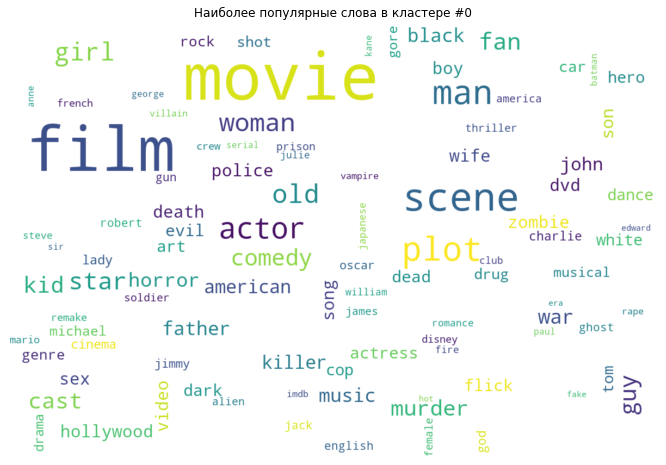

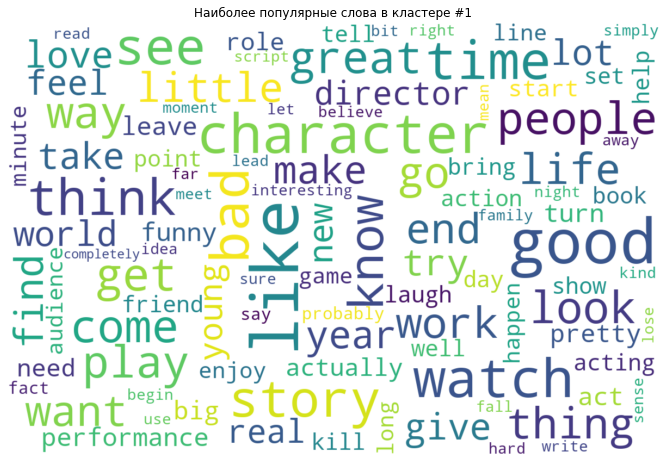

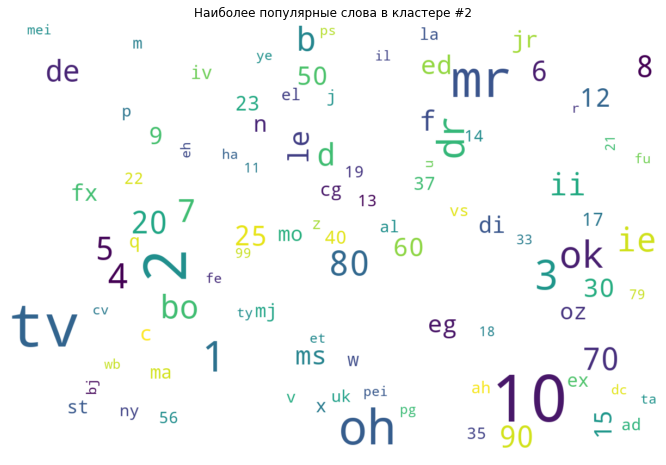

In [ ]:
show_word_cloud_wrapper(models, MODEL_KEYS[0])

*Отображение облака слов для модели CBOW*

Модель: CBOW


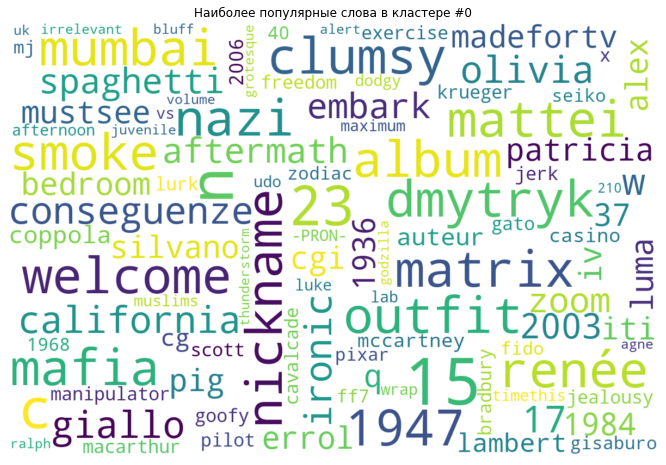

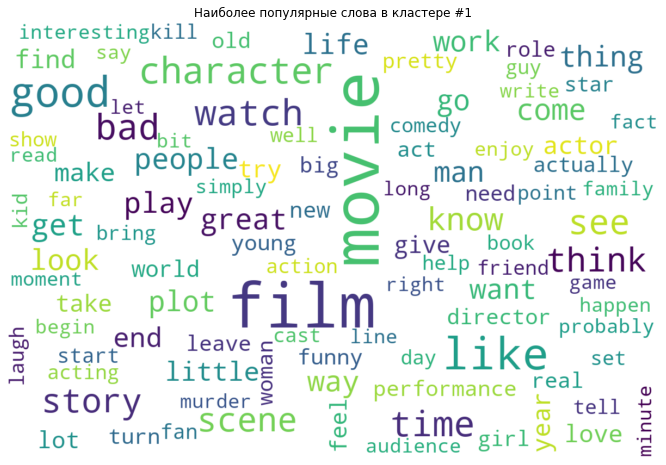

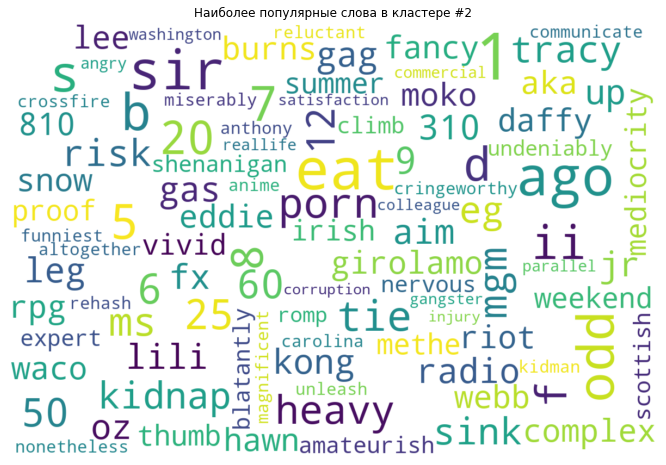

In [ ]:
show_word_cloud_wrapper(models, MODEL_KEYS[1])

*Отображение облака слов для модели Glove*

Модель: Glove


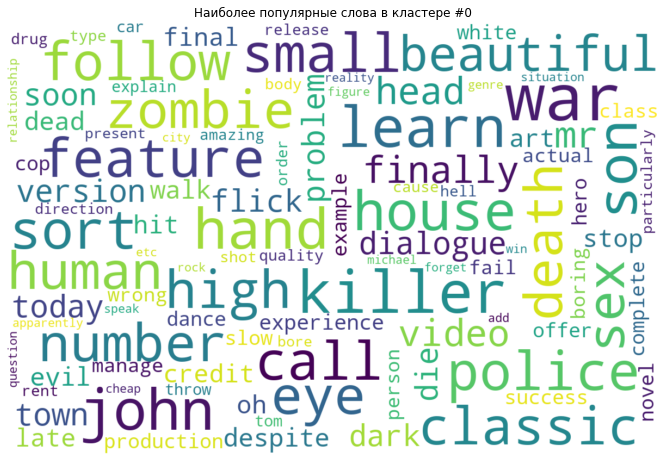

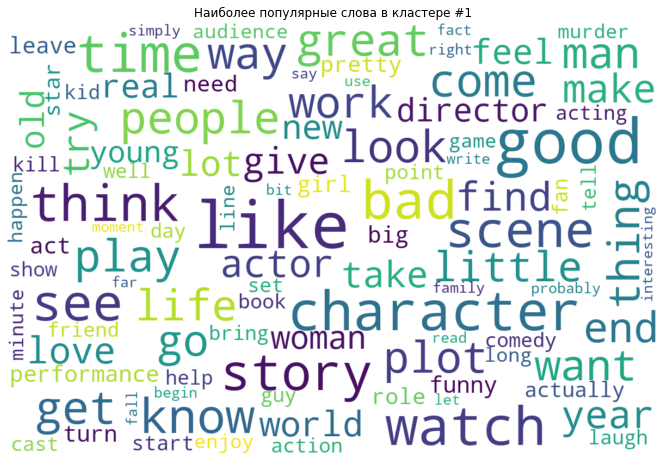

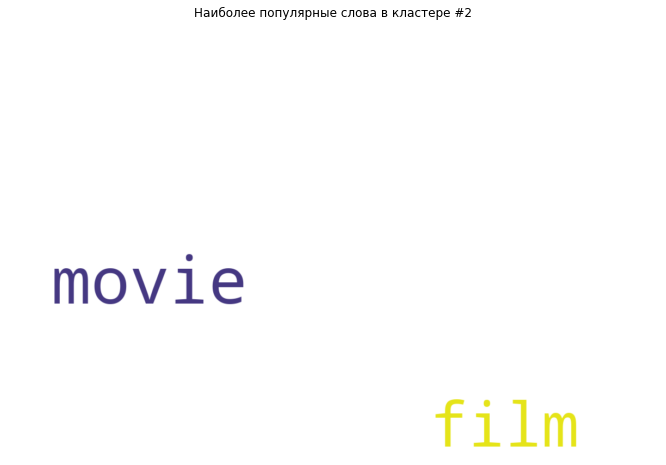

In [ ]:
show_word_cloud_wrapper(models, MODEL_KEYS[2])

Отметим, что в данном случае интерес представляет облако слов для кластера #1 для модели Glove, поскольку именно данныое облако слов заметно отличается от остальных. 

#### 4.3. Тексты для каждого кластера

Вывод нескольких текстов для каждого из кластеров, на которые они были разделены методом кластеризации. В идеальном случае тексты в кластерах должны иметь схожие смыслы или другими словами семантически похожими.

In [ ]:
# метод вывода текстов по кластерам 
def show_docs_by_clusters(docs, labels, docs_count_for_cluster, clusters):
  for k in range(clusters):
    print("Текста из кластера #{}".format(k))
    count = 0
    for (i, label) in enumerate(labels):
      if k == label:
        count += 1
        print("{}: {}".format(count, docs[i]))
        if count == docs_count_for_cluster:
          print()
          break

# метод-обёртка вывода текстов по кластерам
def show_docs_by_clusters_wrapper(models, model_key, docs_count_for_cluster=5, clusters=CLUSTERS_COUNT):
  model = models[model_key]
  print("Модель: {}".format(model["name"]))
  show_docs_by_clusters(texts, model["kmeans_docs_labels"], docs_count_for_cluster, clusters)

*Вывод текстов по кластерам для предобученной модели*

In [ ]:
show_docs_by_clusters_wrapper(models, MODEL_KEYS[0])

Модель: Pretrained
Текста из кластера #0
1: A wonderful little production. <br /><br />The filming technique is very unassuming- very old-time-BBC fashion and gives a comforting, and sometimes discomforting, sense of realism to the entire piece. <br /><br />The actors are extremely well chosen- Michael Sheen not only "has got all the polari" but he has all the voices down pat too! You can truly see the seamless editing guided by the references to Williams' diary entries, not only is it well worth the watching but it is a terrificly written and performed piece. A masterful production about one of the great master's of comedy and his life. <br /><br />The realism really comes home with the little things: the fantasy of the guard which, rather than use the traditional 'dream' techniques remains solid then disappears. It plays on our knowledge and our senses, particularly with the scenes concerning Orton and Halliwell and the sets (particularly of their flat with Halliwell's murals decorat

*Вывод текстов по кластерам для модели CBOW*

In [ ]:
show_docs_by_clusters_wrapper(models, MODEL_KEYS[1])

Модель: CBOW
Текста из кластера #0
1: One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the mai

*Вывод текстов по кластерам для модели Glove*

In [ ]:
show_docs_by_clusters_wrapper(models, MODEL_KEYS[2])

Модель: Glove
Текста из кластера #0
1: One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the ma

#### 4.4. Гистограмма частоты встречаемости значений

Гистограмма, которая является набором столбцов, где каждый столбец показывает количество объектов связанных с конкретным кластером. Более удобное и наглядное представление количества объектов на каждый кластер.

In [ ]:
# метод отображения гистограммы встречаемости по кластерам
def show_cluster_frequency_histogram(labels):
  frequencies = {}
  for label in labels:
    frequencies[label] = frequencies.get(label, 0) + 1
  plt.figure(figsize=(12, 8))
  plt.bar(frequencies.keys(), frequencies.values())
  plt.xlabel("Кластер")

# метод отображения гистограммы встречаемости токенов по кластерам
def show_cluster_tokens_frequency_histogram(models, model_key):
  model = models[model_key]
  print("Модель: {}. Токены".format(model["name"]))
  show_cluster_frequency_histogram(model["kmeans_tokens_labels"])
  plt.ylabel("Количество токенов")
  print()

# метод отображения гистограммы встречаемости текстов по кластерам
def show_cluster_docs_frequency_histogram(models, model_key):
  model = models[model_key]
  print("Модель: {}. Тексты".format(model["name"]))
  show_cluster_frequency_histogram(model["kmeans_docs_labels"])
  plt.ylabel("Количество текстов")
  print()

*Метод отображения гистограммы встречаемости токенов по кластерам для предобученной модели*

Модель: Pretrained. Токены



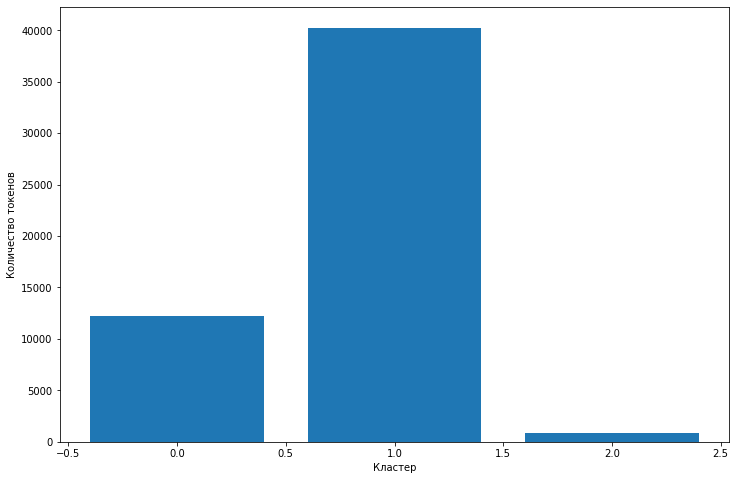

In [ ]:
show_cluster_tokens_frequency_histogram(models, MODEL_KEYS[0])

*Метод отображения гистограммы встречаемости токенов по кластерам для модели CBOW*

Модель: CBOW. Токены



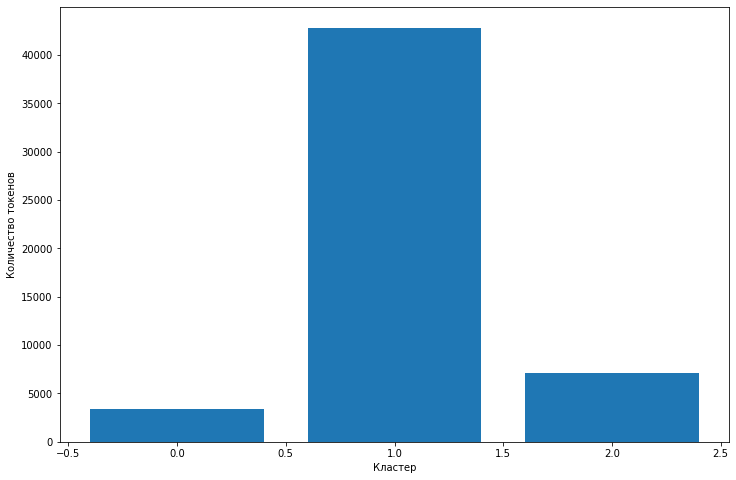

In [ ]:
show_cluster_tokens_frequency_histogram(models, MODEL_KEYS[1])

*Метод отображения гистограммы встречаемости токенов по кластерам для модели Glove*

Модель: Glove. Токены



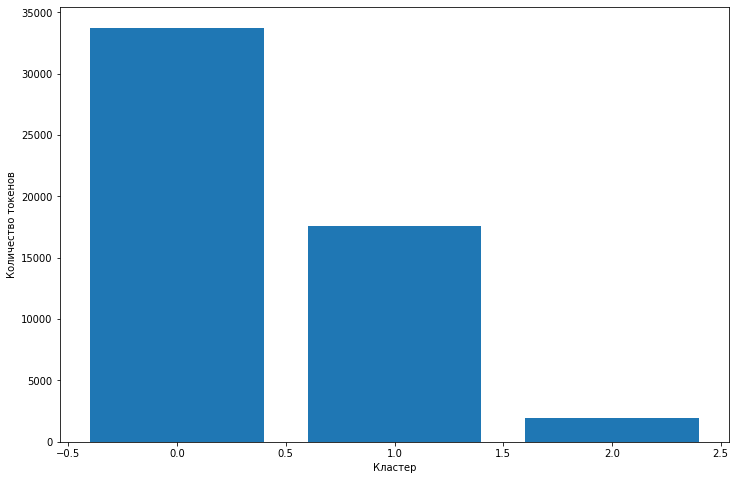

In [ ]:
show_cluster_tokens_frequency_histogram(models, MODEL_KEYS[2])

*Метод отображения гистограммы встречаемости текстов по кластерам для предобученной модели*

Модель: Pretrained. Тексты



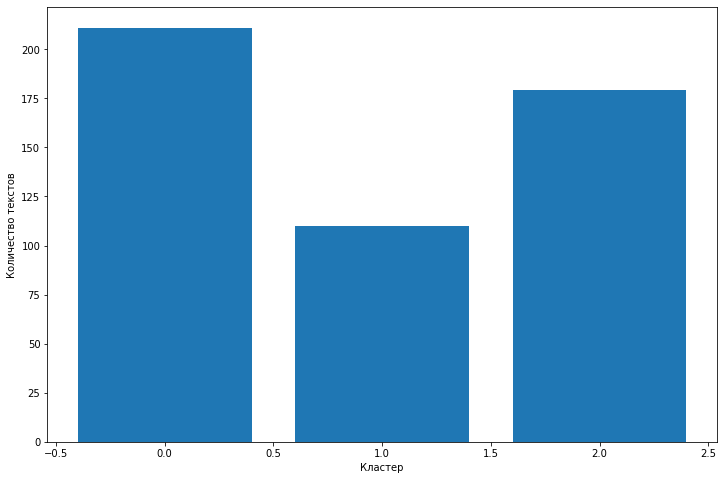

In [ ]:
show_cluster_docs_frequency_histogram(models, MODEL_KEYS[0])

*Метод отображения гистограммы встречаемости текстов по кластерам для модели CBOW*

Модель: CBOW. Тексты



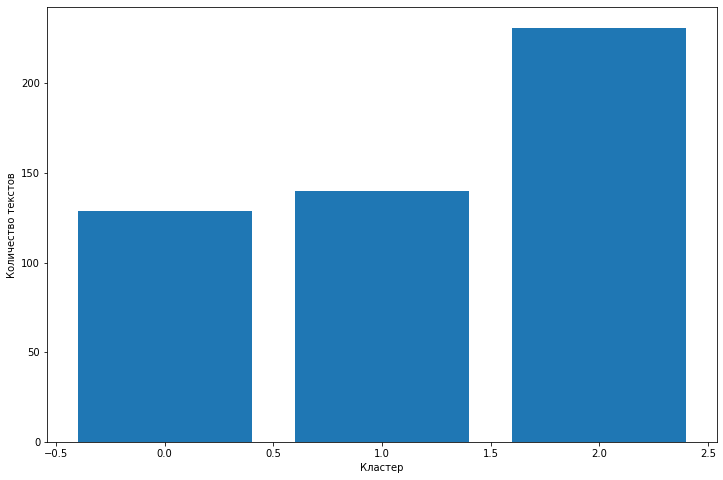

In [ ]:
show_cluster_docs_frequency_histogram(models, MODEL_KEYS[1])

*Метод отображения гистограммы встречаемости текстов по кластерам для модели Glove*

Модель: Glove. Тексты



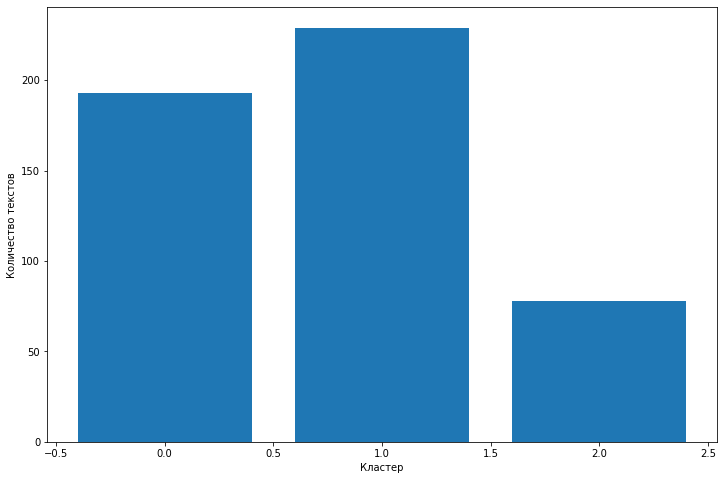

In [ ]:
show_cluster_docs_frequency_histogram(models, MODEL_KEYS[2])

Важно заметить, что более равномерное распределение по кластерам имеет место для текстов в отличие от токенов. 

#### 4.5. Кластеры в двумерном пространстве

Так как размерность векторов текста после векторизации обычно составляет больше двух, следовательно показать их визуально без уменьшения размерности нельзя. Для этого нужно использовать какой-либо метод уменьшения размерности (в данном случае это Метод главных компонент (PCA - Principal Component Analysis). С его помощью уменьшить размерность до 2, чтобы была возможность показать объекты в виде точек на плоскости и также показать их принадлежность кластерам. Это удобно, чтобы наглядно определить качество кластеризации.

In [ ]:
# метод отображения кластеров
def show_clusters(cluster_model, features, labels):
  pca = PCA(n_components=2)
  reduced_features = pca.fit_transform(features)
  reduced_cluster_centers = pca.transform(cluster_model.cluster_centers_)

  plt.figure(figsize=(12, 8))
  plt.scatter(reduced_features[:,0], reduced_features[:,1], c=labels)
  plt.scatter(reduced_cluster_centers[:, 0], reduced_cluster_centers[:,1], marker="x", s=200, c="r")

# метод отображения токенов кластеров
def show_clusters_tokens_wrapper(models, model_key):
  model = models[model_key]
  print("Модель: {}. Токены".format(model["name"]))
  show_clusters(model["kmeans_tokens_model"], model["feature_tokens_flat"], model["kmeans_tokens_labels"])
  plt.title("Распределение векторизованных токенов в двумерном пространстве по кластерам")
  print()

# метод отображения текстов кластеров
def show_clusters_docs_wrapper(models, model_key):
  model = models[model_key]
  print("Модель: {}. Тексты".format(model["name"]))
  show_clusters(model["kmeans_docs_model"], model["feature_docs"], model["kmeans_docs_labels"])
  plt.title("Распределение векторизованных текстов в двумерном пространстве по кластерам")
  print()

*Отображение токенов кластеров для предобученной модели*

Модель: Pretrained. Токены



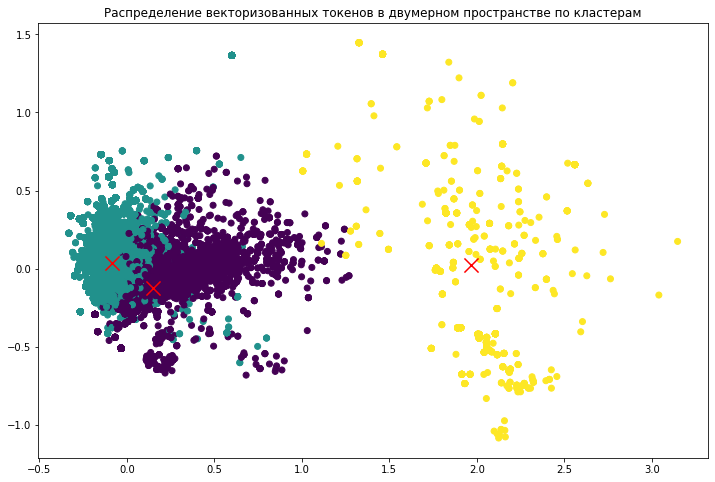

In [ ]:
show_clusters_tokens_wrapper(models, MODEL_KEYS[0])

*Отображение токенов кластеров для модели CBOW*

Модель: CBOW. Токены



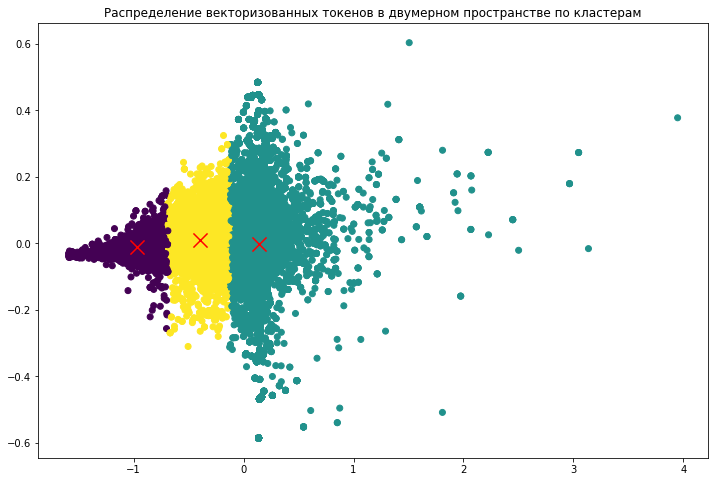

In [ ]:
show_clusters_tokens_wrapper(models, MODEL_KEYS[1])

*Отображение токенов кластеров для модели Glove*

Модель: Glove. Токены



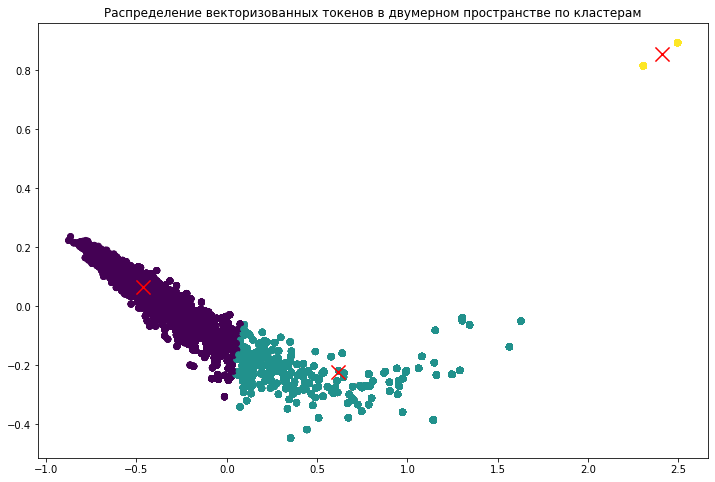

In [ ]:
show_clusters_tokens_wrapper(models, MODEL_KEYS[2])

*Отображение текстов кластеров для предобученной модели*

Модель: Pretrained. Тексты



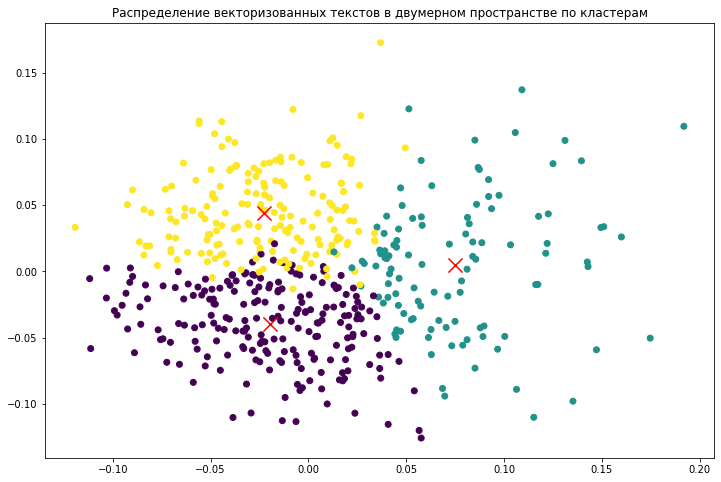

In [ ]:
show_clusters_docs_wrapper(models, MODEL_KEYS[0])

*Отображение текстов кластеров для модели CBOW*

Модель: CBOW. Тексты



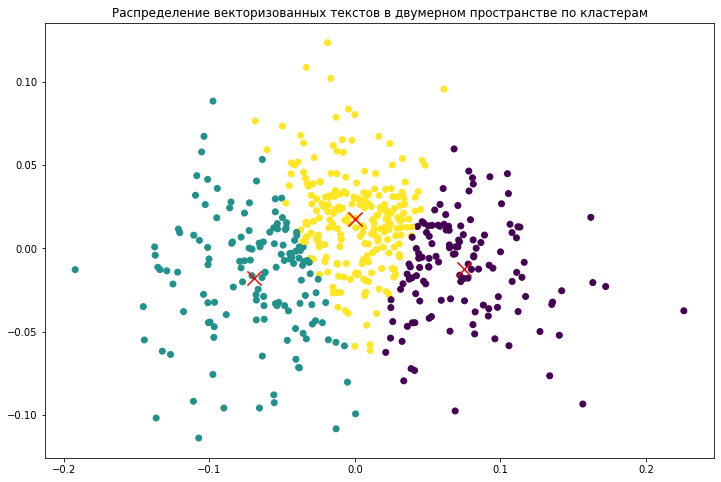

In [ ]:
show_clusters_docs_wrapper(models, MODEL_KEYS[1])

*Отображение текстов кластеров для модели Glove*

Модель: Glove. Тексты



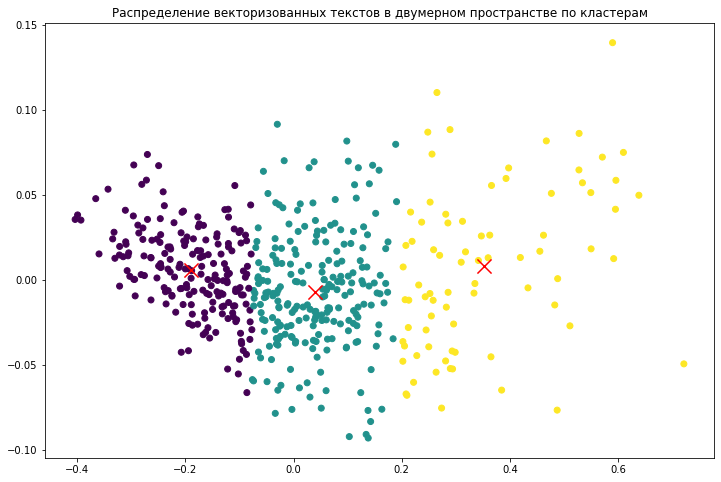

In [ ]:
show_clusters_docs_wrapper(models, MODEL_KEYS[2])

Рассматриваемый вариант представления реализованной кластеризации данных показал, что наиболее тесно к друг другу расположены кластеры модели Glove.

#### 4.6. Метрика Силуэт (Silhouette)

Метрика относится к методу интерпретации и проверки согласованности внутри кластеров данных. Этот метод обеспечивает краткое представление того, насколько хорошо был классифицирован каждый объект. Значение Силуэта – это показатель того, насколько объект похож на свой собственный кластер (сплоченность) по сравнению с другими кластерами (разделение). Значение находится в диапазоне от -1 до +1, где высокое значение указывает на то, что объект хорошо соответствует своему собственному кластеру и плохо соответствует соседним кластерам.

In [ ]:
# метод расчёта значения по метрике Силуэт
def calculate_silhouette_score(features, labels):
  print("Silhouette Coefficient: {:.3f}".format(silhouette_score(features, labels)))

# метод расчёта значения по метрике Силуэт для токенов
def calculate_silhouette_score_tokens_wrapper(models, model_key):
  model = models[model_key]
  print("Модель: {}. Токены".format(model["name"]))
  calculate_silhouette_score(model["feature_tokens_flat"], model["kmeans_tokens_labels"])
  print()

# метод расчёта значения по метрике Силуэт для текстов
def calculate_silhouette_score_docs_wrapper(models, model_key):
  model = models[model_key]
  print("Модель: {}. Тексты".format(model["name"]))
  calculate_silhouette_score(model["feature_docs"], model["kmeans_docs_labels"])
  print()

In [ ]:
# расчёт значения по метрике Силуэт для токенов для предобученной модели
calculate_silhouette_score_tokens_wrapper(models, MODEL_KEYS[0])

# расчёт значения по метрике Силуэт для токенов для модели CBOW
calculate_silhouette_score_tokens_wrapper(models, MODEL_KEYS[1])

# расчёт значения по метрике Силуэт для токенов для модели Glove
calculate_silhouette_score_tokens_wrapper(models, MODEL_KEYS[2])

Модель: Pretrained. Токены
Silhouette Coefficient: 0.214

Модель: CBOW. Токены
Silhouette Coefficient: 0.507

Модель: Glove. Токены
Silhouette Coefficient: 0.623



На основе метрики Силует можно сделать вывод, что в модели Glove токены хорошо соответствуют своим собственным кластерам и плохо соотносятся с соседними.  

In [ ]:
# расчёт значения по метрике Силуэт для текстов для предобученной модели
calculate_silhouette_score_docs_wrapper(models, MODEL_KEYS[0])

# расчёт значения по метрике Силуэт для текстов для модели CBOW
calculate_silhouette_score_docs_wrapper(models, MODEL_KEYS[1])

# расчёт значения по метрике Силуэт для текстов для модели Glove
calculate_silhouette_score_docs_wrapper(models, MODEL_KEYS[2])

Модель: Pretrained. Тексты
Silhouette Coefficient: 0.095

Модель: CBOW. Тексты
Silhouette Coefficient: 0.283

Модель: Glove. Тексты
Silhouette Coefficient: 0.484



Вывод, который был обозначен выше, также подтверждается и для кластеров в слуучае с текстами: в модели Glove метрика выше 0,5.

#### 4.7. Метод локтя (Elbow method)

Данный метод является эвристикой, которая используется для определения количества кластеров в наборе данных. Суть состоит в построении графика объясненной вариации в зависимости от количества кластеров и выборе изгиба кривой в качестве количества используемых кластеров.

In [ ]:
# метод отображения кривой Elbow
def show_elbow_curve(features, max_clusters):
  squared_errors = []
  for clusters in range(1, max_clusters):
    kmeans = KMeans(n_clusters=clusters).fit(features)
    squared_errors.append(kmeans.inertia_)
  
  optimal_clusters = np.argmin(squared_errors) + 2

  plt.figure(figsize=(12, 8))
  plt.plot(range(1, max_clusters), squared_errors)
  plt.title("Elbow Curve")
  plt.xlabel("Количество кластеров")
  plt.ylabel("Квадратичная ошибка")

# метод отображения кривой Elbow для токенов
def show_elbow_curve_tokens_wrapper(models, model_key, max_clusters=CLUSTERS_COUNT * 2):
  model = models[model_key]
  print("Модель: {}. Токены".format(model["name"]))
  show_elbow_curve(model["feature_tokens_flat"], max_clusters)
  print()

# метод отображения кривой Elbow для текстов
def show_elbow_curve_docs_wrapper(models, model_key, max_clusters=CLUSTERS_COUNT * 2):
  model = models[model_key]
  print("Модель: {}. Тексты".format(model["name"]))
  show_elbow_curve(model["feature_docs"], max_clusters)
  print()

*Отображение кривой Elbow для токенов для предобученной модели*

Модель: Pretrained. Токены



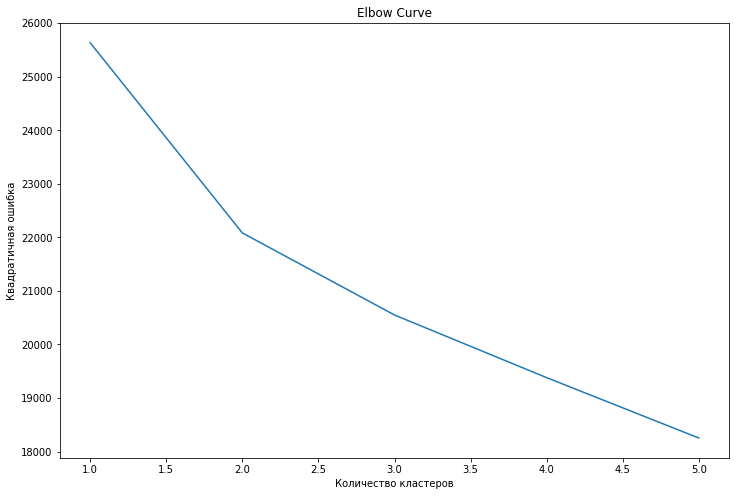

In [ ]:
show_elbow_curve_tokens_wrapper(models, MODEL_KEYS[0])

*Отображение кривой Elbow для токенов для модели CBOW*

Модель: CBOW. Токены



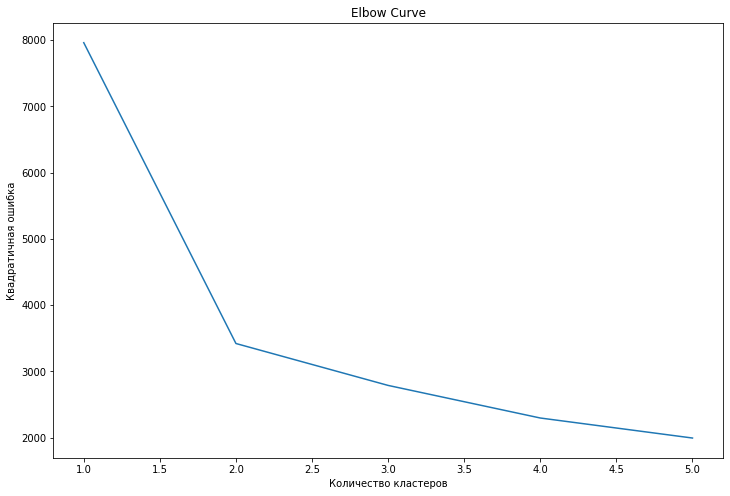

In [ ]:
show_elbow_curve_tokens_wrapper(models, MODEL_KEYS[1])

*Отображение кривой Elbow для токенов для модели Glove*

Модель: Glove. Токены



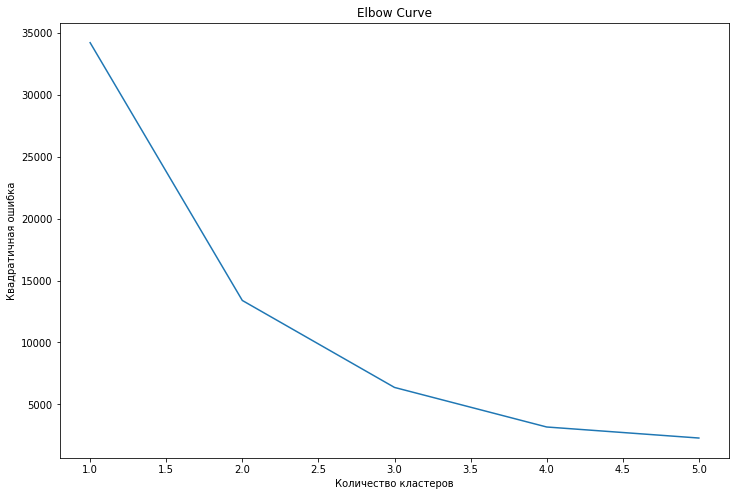

In [ ]:
show_elbow_curve_tokens_wrapper(models, MODEL_KEYS[2])

*Отображение кривой Elbow для текстов для предобученной модели*

Модель: Pretrained. Тексты



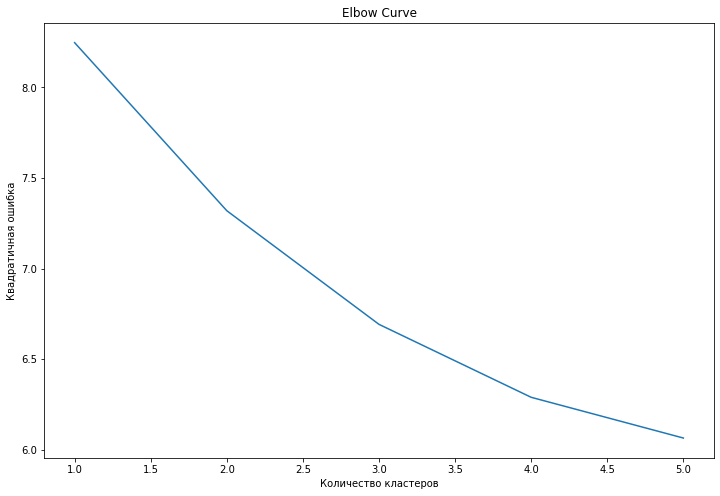

In [ ]:
show_elbow_curve_docs_wrapper(models, MODEL_KEYS[0])

*Отображение кривой Elbow для текстов для модели CBOW*

Модель: CBOW. Тексты



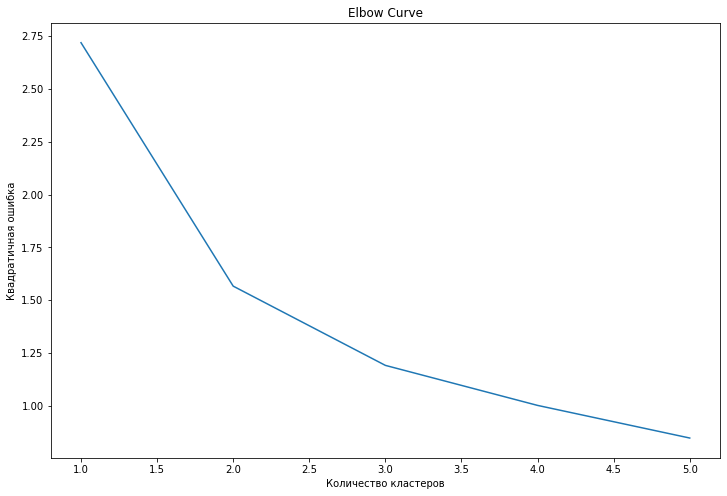

In [ ]:
show_elbow_curve_docs_wrapper(models, MODEL_KEYS[1])

*Отображение кривой Elbow для текстов для модели Glove*

Модель: Glove. Тексты



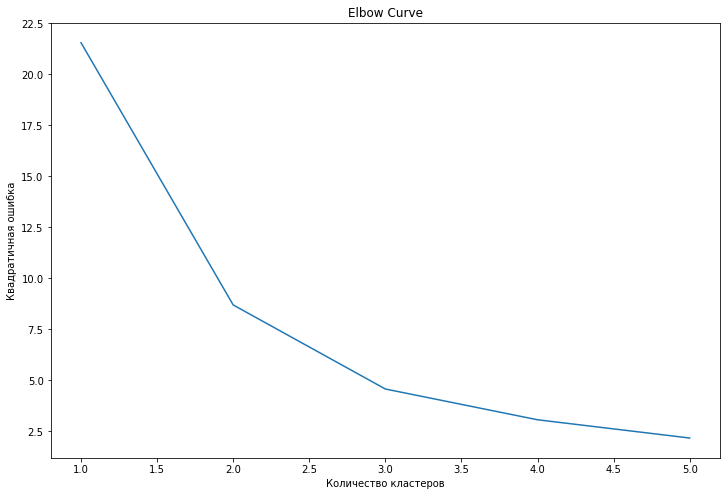

In [ ]:
show_elbow_curve_docs_wrapper(models, MODEL_KEYS[2])

Касательно количества кластеров, которые показывает метрика локтя, можно утверждать, что во всех трех рассматриваемых моделях количество кластеров относительно равное. 

### 5. Conclusion

Таким образом, в ходе выполнения проекты были получены слудующие результаты. Во-первых, построены модели CBOW/Glove/Fasttext. Во-вторых, представлена кластеризация полученных результатов после реализации рассматриваемых моделей. Наконец, сделаны соответствующие выводы в ходе выполнения проекта. 